In [15]:
import warnings
warnings.filterwarnings('ignore')

# data wrangling & pre-processing
import pandas as pd
import numpy as np

# data visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn.model_selection import train_test_split

#model validation
from sklearn.metrics import log_loss,roc_auc_score,precision_score,f1_score,recall_score,roc_curve,auc
from sklearn.metrics import classification_report, confusion_matrix,accuracy_score,fbeta_score,matthews_corrcoef
from sklearn import metrics
from sklearn.metrics._scorer import _SCORERS

# cross validation
from sklearn.model_selection import StratifiedKFold

# machine learning algorithms
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier,VotingClassifier,AdaBoostClassifier,GradientBoostingClassifier,RandomForestClassifier,ExtraTreesClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC 
import xgboost as xgbclassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier, ExtraTreesClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import SGDClassifier
import xgboost as xgb

from scipy import stats

In [16]:
dt = pd.read_csv('Replaced_Dataset.csv')

In [3]:
dt.shape

(699, 11)

In [4]:
dt['Classes'].value_counts()

2    458
4    241
Name: Classes, dtype: int64

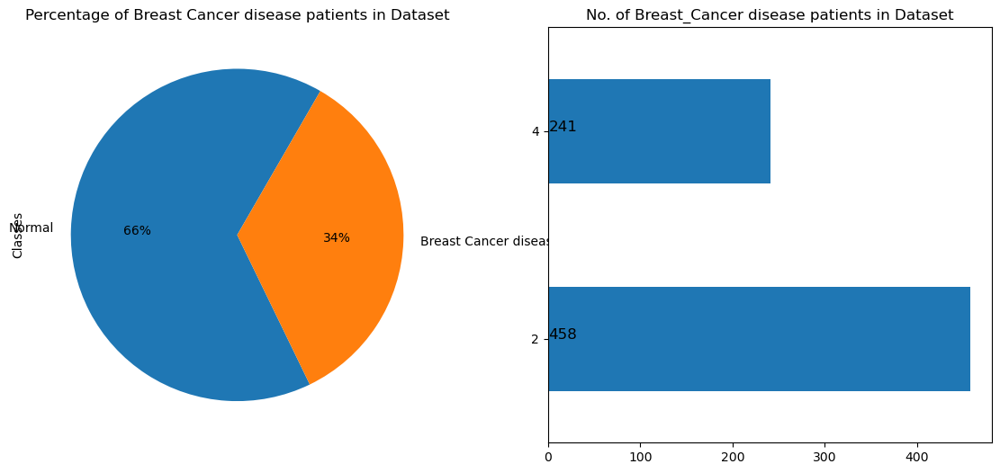

In [9]:
# Plotting attrition of employees
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, sharey=False, figsize=(14,6))

ax1 = dt['Classes'].value_counts().plot.pie( x="Breast Cancer disease" ,y ='no.of patients', 
                   autopct = "%1.0f%%",labels=["Normal","Breast Cancer disease"], startangle = 60,ax=ax1);
ax1.set(title = 'Percentage of Breast Cancer disease patients in Dataset')

ax2 = dt["Classes"].value_counts().plot(kind="barh" ,ax =ax2)
for i,j in enumerate(dt["Classes"].value_counts().values):
    ax2.text(.5,i,j,fontsize=12)
ax2.set(title = 'No. of Breast_Cancer disease patients in Dataset')
plt.show()

In [65]:
dt.head(10)

,Clump_Thickness,Uniformity_Cell_Size,UniformityofCellShape,MarginalAdhesion,Single_Epithelial,BareNuclei,BlandChromatin,NormaChromatin,Mitoses,Classes
0,5,1,1,1,2,1.0,3,1,1,0
1,5,4,4,5,7,10.0,3,2,1,0
2,3,1,1,1,2,2.0,3,1,1,0
3,6,8,8,1,3,4.0,3,7,1,0
4,4,1,1,3,2,1.0,3,1,1,0
5,8,10,10,8,7,10.0,9,7,1,1
6,1,1,1,1,2,10.0,3,1,1,0
7,2,1,2,1,2,1.0,3,1,1,0
8,2,1,1,1,2,1.0,1,1,5,0
9,4,2,1,1,2,1.0,2,1,1,0


In [17]:
dt.drop(columns=['I.D'], inplace=True)

In [28]:
(dt[dt.duplicated()])

,I.D,Clump_Thickness,Uniformity_Cell_Size,Uniformity_CellNaNShape,Marginal_Adhesion,Single_Epithelial,Bare_Nuclei,Bland_Chromatin,Normal_Chromatin,Mitoses,Classes
208,1218860,1,1,1,1,1,1.0,3,1,1,2
253,1100524,6,10,10,2,8,10.0,7,3,3,4
254,1116116,9,10,10,1,10,8.0,3,3,1,4
258,1198641,3,1,1,1,2,1.0,3,1,1,2
272,320675,3,3,5,2,3,10.0,7,1,1,4
338,704097,1,1,1,1,1,1.0,2,1,1,2
561,1321942,5,1,1,1,2,1.0,3,1,1,2
684,466906,1,1,1,1,2,1.0,1,1,1,2


In [22]:
duplicated_rows = dt[dt.duplicated(keep=False)]

# Print duplicated rows
print("Duplicated Rows:")
print(duplicated_rows)

Duplicated Rows:
         I.D  Clump_Thickness  Uniformity_Cell_Size  Uniformity_CellNaNShape  \
42   1100524                6                    10                       10   
62   1116116                9                    10                       10   
168  1198641                3                     1                        1   
207  1218860                1                     1                        1   
208  1218860                1                     1                        1   
253  1100524                6                    10                       10   
254  1116116                9                    10                       10   
258  1198641                3                     1                        1   
267   320675                3                     3                        5   
272   320675                3                     3                        5   
314   704097                1                     1                        1   
338   704097           

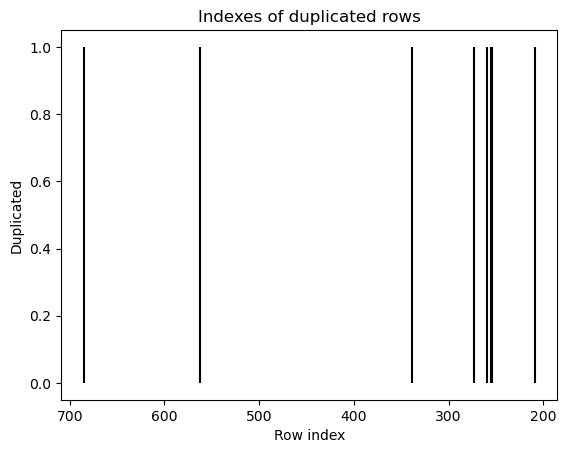

In [29]:
import pandas as pd
import matplotlib.pyplot as plt

duplicated_rows = pd.DataFrame({
    'duplicated': dt.duplicated(),
    'row': range(1, len(dt) + 1)
})


duplicated_rows = duplicated_rows[duplicated_rows['duplicated']]

plt.figure()
plt.vlines(duplicated_rows['row'], ymin=0, ymax=1, colors='black')
plt.gca().invert_xaxis()
plt.title('Indexes of duplicated rows')
plt.xlabel('Row index')
plt.ylabel('Duplicated')
plt.show()

In [32]:
duplicate_rows = dt.duplicated()
print(duplicate_rows)


0      False
1      False
2      False
3      False
4      False
       ...  
694    False
695    False
696    False
697    False
698    False
Length: 699, dtype: bool


In [17]:
# Define mapping dictionary
mapping = {2: 0, 4: 1}

# Map values in 'Classes' column
dt['Classes'] = dt['Classes'].map(mapping)

In [18]:

dt = dt.drop_duplicates(keep='first')

In [7]:
dt.shape

(691, 11)

In [19]:
dt.drop(columns=['I.D'], inplace=True)

In [20]:
dt.shape

(691, 10)

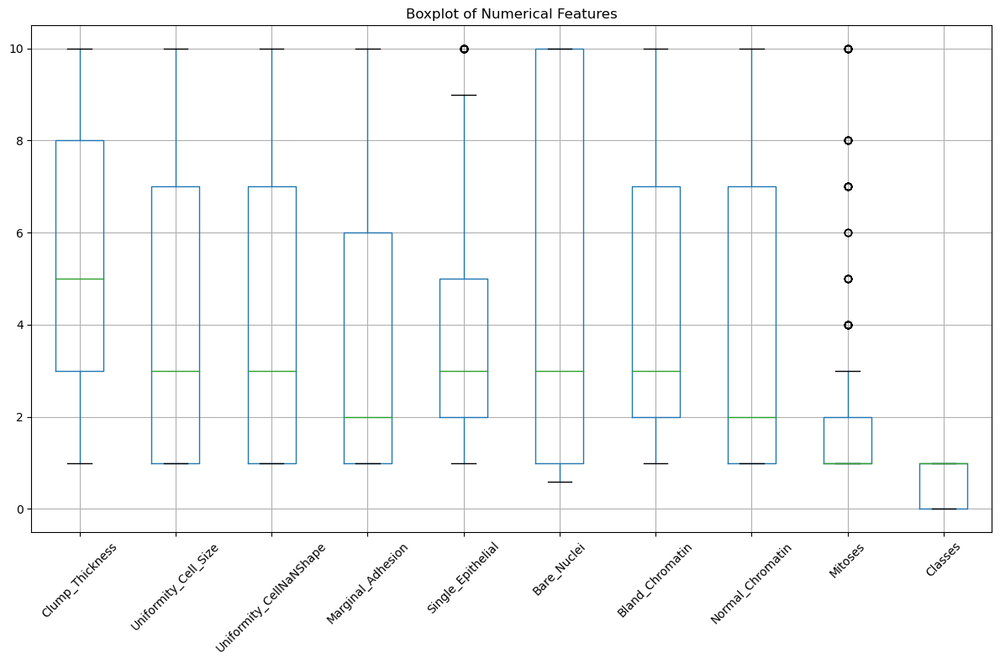

In [99]:
plt.figure(figsize=(12, 8))
dt.boxplot()
plt.title('Boxplot of Numerical Features')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [21]:
from imblearn.under_sampling import RandomUnderSampler,TomekLinks
from imblearn.over_sampling import RandomOverSampler, SMOTE, ADASYN
from imblearn.combine import SMOTETomek

In [22]:
# segregating dataset into features i.e., X and target variables i.e., y
X = dt.drop(['Classes'],axis=1)
y = dt['Classes']

In [76]:
y

0      0
1      0
2      0
3      0
4      0
      ..
694    0
695    0
696    1
697    1
698    1
Name: Classes, Length: 691, dtype: int64

In [29]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=11)

In [14]:
## checking distribution of traget variable in train test split
print('Distribution of traget variable in training set')
print(y_train.value_counts())

print('Distribution of traget variable in test set')
print(y_test.value_counts())

Distribution of traget variable in training set
0    358
1    194
Name: Classes, dtype: int64
Distribution of traget variable in test set
0    95
1    44
Name: Classes, dtype: int64


In [30]:
def plot_resampling_result(y_resampled, title):
    plt.figure(figsize=(4, 4))
    pd.Series(y_resampled).value_counts().plot.pie(autopct="%1.1f%%", startangle=90, colors=['skyblue','lightcoral'])
    plt.title(title)
    plt.show()

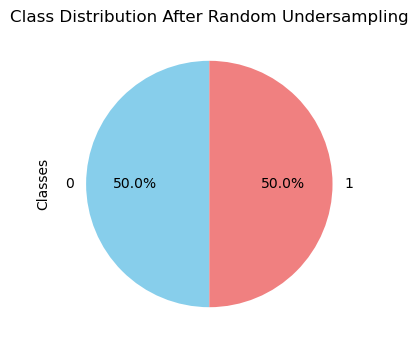

In [31]:
rus = RandomUnderSampler(random_state=101)
X_rus, y_rus = rus.fit_resample(X_train, y_train)
plot_resampling_result(y_rus, 'Class Distribution After Random Undersampling')

In [17]:
y_train.value_counts()

0    358
1    194
Name: Classes, dtype: int64

In [18]:
y_rus.value_counts()

0    194
1    194
Name: Classes, dtype: int64

In [19]:
print('No. of records discarded:' ,y_train.shape[0] - y_rus.shape[0])

No. of records discarded: 164


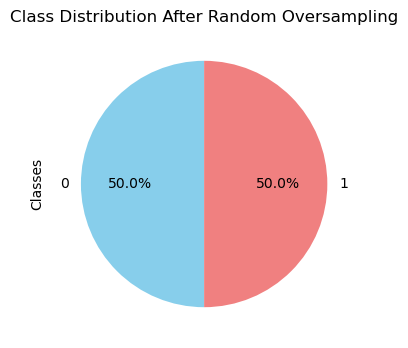

In [32]:
ros = RandomOverSampler(random_state=111)
X_ros, y_ros = ros.fit_resample(X_train, y_train)
plot_resampling_result(y_ros, 'Class Distribution After Random Oversampling')


In [21]:
y_train.value_counts()

0    358
1    194
Name: Classes, dtype: int64

In [22]:
y_ros.value_counts()

0    358
1    358
Name: Classes, dtype: int64

In [23]:
print ('No. of records added:' ,y_ros.shape[0] - y_train.shape[0])

No. of records added: 164


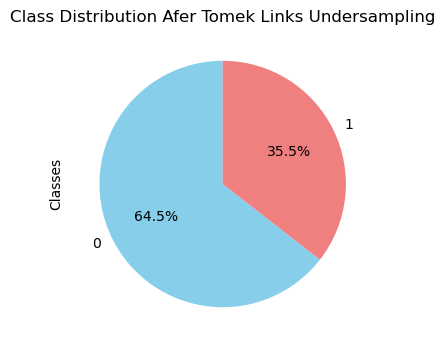

In [24]:
tomek = TomekLinks()
X_tl, y_tl = tomek.fit_resample(X_train, y_train)
plot_resampling_result(y_tl, 'Class Distribution Afer Tomek Links Undersampling')

In [25]:
y_train.value_counts()

0    358
1    194
Name: Classes, dtype: int64

In [26]:
y_tl.value_counts()

0    352
1    194
Name: Classes, dtype: int64

In [27]:
print('No. of records discarded:', y_train.shape[0] -y_tl.shape[0])

No. of records discarded: 6


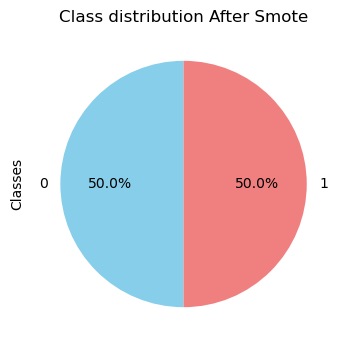

In [28]:
smote = SMOTE(random_state=123)
X_smote, y_smote = smote.fit_resample(X_train, y_train)
plot_resampling_result(y_smote, 'Class distribution After Smote')

In [29]:
y_train.value_counts()

0    358
1    194
Name: Classes, dtype: int64

In [30]:
y_smote.value_counts()

0    358
1    358
Name: Classes, dtype: int64

In [31]:
print('No. of records added:', y_smote.shape[0] - y_train.shape[0])

No. of records added: 164


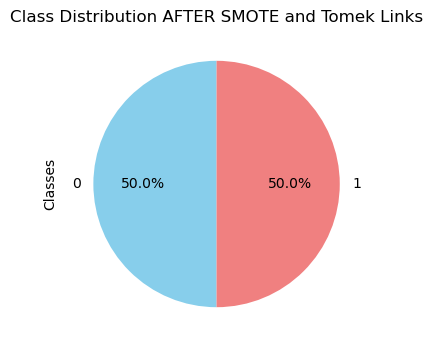

In [32]:
smote_tomek = SMOTETomek(random_state=20)
X_st, y_st = smote_tomek.fit_resample(X_train, y_train)
plot_resampling_result(y_st, 'Class Distribution AFTER SMOTE and Tomek Links')

In [33]:
y_train.value_counts()

0    358
1    194
Name: Classes, dtype: int64

In [34]:
y_st.value_counts()

0    357
1    357
Name: Classes, dtype: int64

In [35]:
print('No. of records added:' ,y_st.shape[0] - y_train.shape[0])

No. of records added: 162


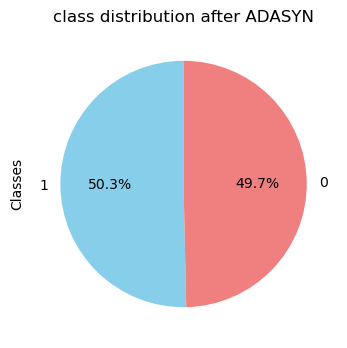

In [36]:
adasyn = ADASYN(random_state=211)
X_adasyn, y_adasyn = adasyn.fit_resample(X_train, y_train)
plot_resampling_result(y_adasyn, 'class distribution after ADASYN')

In [37]:
y_adasyn.value_counts()

1    363
0    358
Name: Classes, dtype: int64

In [38]:
print('No. of records added:', y_adasyn.shape[0] -y_train.shape[0])

No. of records added: 169


In [39]:
# Training Random Forest Models
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Training Cross-validation Models
from sklearn.metrics import make_scorer, recall_score, matthews_corrcoef
from sklearn.model_selection import cross_validate

model_cv = RandomForestClassifier(random_state=42)
cv_scoring = {'MCC': make_scorer(matthews_corrcoef)}
cv = cross_validate(model_cv, X_train, y_train, cv=5, scoring=cv_scoring)

# Apply model to make prediction
from sklearn.metrics import matthews_corrcoef

y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)
  
mcc_train = matthews_corrcoef(y_train, y_train_pred)
mcc_test = matthews_corrcoef(y_test, y_test_pred)
mcc_cv = cv['test_MCC'].mean()

# Display model performance results
df_labels = pd.Series(['MCC_train', 'MCC_CV', 'MCC_test'], name = 'Performance_metric_names')
df_values = pd.Series([mcc_train, mcc_cv, mcc_test], name = 'Performance_metric_values')
df1 = pd.concat([df_labels, df_values], axis=1)
df1

,Performance_metric_names,Performance_metric_values
0,MCC_train,1.000000
1,MCC_CV,0.923419
2,MCC_test,0.966746


In [40]:
# Training Random Forest Models
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(random_state=42)
model.fit(X_rus, y_rus)

# Training Cross-validation Models
from sklearn.metrics import make_scorer, recall_score, matthews_corrcoef
from sklearn.model_selection import cross_validate

model_cv = RandomForestClassifier(random_state=42)
cv_scoring = {'MCC': make_scorer(matthews_corrcoef)}
cv = cross_validate(model_cv, X_rus, y_rus, cv=5, scoring=cv_scoring)

# Apply model to make prediction
from sklearn.metrics import matthews_corrcoef

y_train_pred = model.predict(X_rus)
y_test_pred = model.predict(X_test)
  
mcc_train = matthews_corrcoef(y_rus, y_train_pred)
mcc_test = matthews_corrcoef(y_test, y_test_pred)
mcc_cv = cv['test_MCC'].mean()

# Display model performance results
df_labels = pd.Series(['MCC_train', 'MCC_CV', 'MCC_test'], name = 'Performance_metric_names')
df_values = pd.Series([mcc_train, mcc_cv, mcc_test], name = 'Performance_metric_values')
df2 = pd.concat([df_labels, df_values], axis=1)
df2
     

,Performance_metric_names,Performance_metric_values
0,MCC_train,1.000000
1,MCC_CV,0.939077
2,MCC_test,0.967670


In [41]:
# Training Random Forest Models
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(random_state=42)
model.fit(X_ros, y_ros)

# Training Cross-validation Models
from sklearn.metrics import make_scorer, recall_score, matthews_corrcoef
from sklearn.model_selection import cross_validate

model_cv = RandomForestClassifier(random_state=42)
cv_scoring = {'MCC': make_scorer(matthews_corrcoef)}
cv = cross_validate(model_cv, X_ros, y_ros, cv=5, scoring=cv_scoring)

# Apply model to make prediction
from sklearn.metrics import matthews_corrcoef

y_train_pred = model.predict(X_ros)
y_test_pred = model.predict(X_test)
  
mcc_train = matthews_corrcoef(y_ros, y_train_pred)
mcc_test = matthews_corrcoef(y_test, y_test_pred)
mcc_cv = cv['test_MCC'].mean()

# Display model performance results
df_labels = pd.Series(['MCC_train', 'MCC_CV', 'MCC_test'], name = 'Performance_metric_names')
df_values = pd.Series([mcc_train, mcc_cv, mcc_test], name = 'Performance_metric_values')
df3 = pd.concat([df_labels, df_values], axis=1)
df3
     

,Performance_metric_names,Performance_metric_values
0,MCC_train,1.000000
1,MCC_CV,0.956362
2,MCC_test,0.950552


In [42]:

# Training Random Forest Models
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(random_state=42, class_weight='balanced') # Class weight balancing
model.fit(X_train, y_train)

# Training Cross-validation Models
from sklearn.metrics import make_scorer, recall_score, matthews_corrcoef
from sklearn.model_selection import cross_validate

model_cv = RandomForestClassifier(random_state=42, class_weight='balanced') # Class weight balancing
cv_scoring = {'MCC': make_scorer(matthews_corrcoef)}
cv = cross_validate(model_cv, X_train, y_train, cv=5, scoring=cv_scoring)

# Apply model to make prediction
from sklearn.metrics import matthews_corrcoef

y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)
  
mcc_train = matthews_corrcoef(y_train, y_train_pred)
mcc_test = matthews_corrcoef(y_test, y_test_pred)
mcc_cv = cv['test_MCC'].mean()

# Display model performance results
df_labels = pd.Series(['MCC_train', 'MCC_CV', 'MCC_test'], name = 'Performance_metric_names')
df_values = pd.Series([mcc_train, mcc_cv, mcc_test], name = 'Performance_metric_values')
df4 = pd.concat([df_labels, df_values], axis=1)
df4

,Performance_metric_names,Performance_metric_values
0,MCC_train,1.000000
1,MCC_CV,0.915049
2,MCC_test,0.966746


In [43]:
# Training Random Forest Models
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(random_state=42)
model.fit(X_adasyn, y_adasyn)

# Training Cross-validation Models
from sklearn.metrics import make_scorer, recall_score, matthews_corrcoef
from sklearn.model_selection import cross_validate

model_cv = RandomForestClassifier(random_state=42)
cv_scoring = {'MCC': make_scorer(matthews_corrcoef)}
cv = cross_validate(model_cv, X_adasyn, y_adasyn, cv=5, scoring=cv_scoring)

# Apply model to make prediction
from sklearn.metrics import matthews_corrcoef

y_train_pred = model.predict(X_adasyn)
y_test_pred = model.predict(X_test)
  
mcc_train = matthews_corrcoef(y_adasyn, y_train_pred)
mcc_test = matthews_corrcoef(y_test, y_test_pred)
mcc_cv = cv['test_MCC'].mean()

# Display model performance results
df_labels = pd.Series(['MCC_train', 'MCC_CV', 'MCC_test'], name = 'Performance_metric_names')
df_values = pd.Series([mcc_train, mcc_cv, mcc_test], name = 'Performance_metric_values')
df5 = pd.concat([df_labels, df_values], axis=1)
df5

,Performance_metric_names,Performance_metric_values
0,MCC_train,1.000000
1,MCC_CV,0.945244
2,MCC_test,0.952159


In [44]:
# Training Random Forest Models
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(random_state=42)
model.fit(X_st, y_st)

# Training Cross-validation Models
from sklearn.metrics import make_scorer, recall_score, matthews_corrcoef
from sklearn.model_selection import cross_validate

model_cv = RandomForestClassifier(random_state=42)
cv_scoring = {'MCC': make_scorer(matthews_corrcoef)}
cv = cross_validate(model_cv, X_st, y_st, cv=5, scoring=cv_scoring)

# Apply model to make prediction
from sklearn.metrics import matthews_corrcoef

y_train_pred = model.predict(X_st)
y_test_pred = model.predict(X_test)
  
mcc_train = matthews_corrcoef(y_st, y_train_pred)
mcc_test = matthews_corrcoef(y_test, y_test_pred)
mcc_cv = cv['test_MCC'].mean()

# Display model performance results
df_labels = pd.Series(['MCC_train', 'MCC_CV', 'MCC_test'], name = 'Performance_metric_names')
df_values = pd.Series([mcc_train, mcc_cv, mcc_test], name = 'Performance_metric_values')
df6 = pd.concat([df_labels, df_values], axis=1)
df6

,Performance_metric_names,Performance_metric_values
0,MCC_train,1.000000
1,MCC_CV,0.941803
2,MCC_test,0.967670


In [45]:
# Training Random Forest Models
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(random_state=42)
model.fit(X_smote, y_smote)

# Training Cross-validation Models
from sklearn.metrics import make_scorer, recall_score, matthews_corrcoef
from sklearn.model_selection import cross_validate

model_cv = RandomForestClassifier(random_state=42)
cv_scoring = {'MCC': make_scorer(matthews_corrcoef)}
cv = cross_validate(model_cv, X_smote, y_smote, cv=5, scoring=cv_scoring)

# Apply model to make prediction
from sklearn.metrics import matthews_corrcoef

y_train_pred = model.predict(X_smote)
y_test_pred = model.predict(X_test)
  
mcc_train = matthews_corrcoef(y_smote, y_train_pred)
mcc_test = matthews_corrcoef(y_test, y_test_pred)
mcc_cv = cv['test_MCC'].mean()

# Display model performance results
df_labels = pd.Series(['MCC_train', 'MCC_CV', 'MCC_test'], name = 'Performance_metric_names')
df_values = pd.Series([mcc_train, mcc_cv, mcc_test], name = 'Performance_metric_values')
df7 = pd.concat([df_labels, df_values], axis=1)
df7

,Performance_metric_names,Performance_metric_values
0,MCC_train,1.000000
1,MCC_CV,0.945081
2,MCC_test,0.966746


In [46]:
# Training Random Forest Models
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(random_state=42)
model.fit(X_tl, y_tl)

# Training Cross-validation Models
from sklearn.metrics import make_scorer, recall_score, matthews_corrcoef
from sklearn.model_selection import cross_validate

model_cv = RandomForestClassifier(random_state=42)
cv_scoring = {'MCC': make_scorer(matthews_corrcoef)}
cv = cross_validate(model_cv, X_tl, y_tl, cv=5, scoring=cv_scoring)

# Apply model to make prediction
from sklearn.metrics import matthews_corrcoef

y_train_pred = model.predict(X_tl)
y_test_pred = model.predict(X_test)
  
mcc_train = matthews_corrcoef(y_tl, y_train_pred)
mcc_test = matthews_corrcoef(y_test, y_test_pred)
mcc_cv = cv['test_MCC'].mean()

# Display model performance results
df_labels = pd.Series(['MCC_train', 'MCC_CV', 'MCC_test'], name = 'Performance_metric_names')
df_values = pd.Series([mcc_train, mcc_cv, mcc_test], name = 'Performance_metric_values')
df8 = pd.concat([df_labels, df_values], axis=1)
df8

,Performance_metric_names,Performance_metric_values
0,MCC_train,1.000000
1,MCC_CV,0.937228
2,MCC_test,0.966746


In [48]:
df = pd.concat([df1.Performance_metric_values,
                df2.Performance_metric_values,
                df3.Performance_metric_values,
                df4.Performance_metric_values,
                df5.Performance_metric_values,
                df6.Performance_metric_values,
                df7.Performance_metric_values,
                df8.Performance_metric_values], axis=1)
df.columns = ['No class balancing', 'Class balancing (undersampling)', 'Class balancing (oversampling)', 'Class balancing (class weights)' ,
              'Class balancing (Adasyn)', 'Class balancing (Smote_tomek)','Class balancing(Smote)', 'Class balacning(Tomelink)']
df = df.T
df.columns = ['Training', 'CV', 'Test']
df

,Training,CV,Test
No class balancing,1.0,0.923419,0.966746
Class balancing (undersampling),1.0,0.939077,0.967670
Class balancing (oversampling),1.0,0.956362,0.950552
Class balancing (class weights),1.0,0.915049,0.966746
Class balancing (Adasyn),1.0,0.945244,0.952159
Class balancing (Smote_tomek),1.0,0.941803,0.967670
Class balancing(Smote),1.0,0.945081,0.966746
Class balacning(Tomelink),1.0,0.937228,0.966746


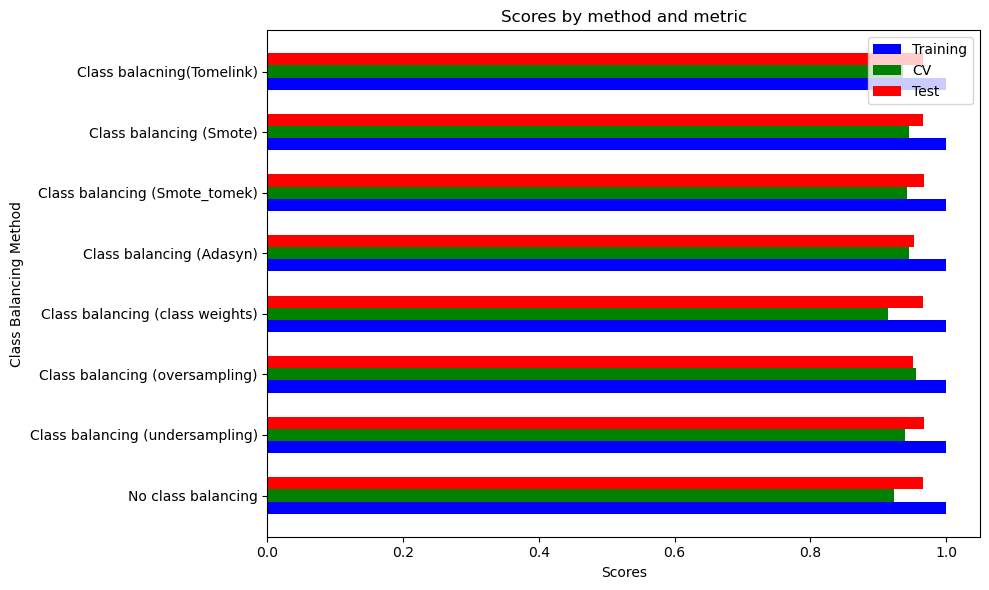

In [3]:
import numpy as np
import matplotlib.pyplot as plt

data = {
    "No class balancing": [1.0, 0.923419, 0.966746],
    "Class balancing (undersampling)": [1.0, 0.939077, 0.967670],
    "Class balancing (oversampling)": [1.0, 0.956362, 0.950552],
    "Class balancing (class weights)": [1.0, 0.915049, 0.966746],
    "Class balancing (Adasyn)": [1.0, 0.945244, 0.952159],
    "Class balancing (Smote_tomek)": [1.0, 0.941803, 0.967670],
    "Class balancing (Smote)": [1.0, 0.945081, 0.966746],
    "Class balacning(Tomelink)": [1.0, 0.937228, 0.966746]
}

metrics = ["Training", "CV", "Test"]
num_methods = len(data)

bar_width = 0.2
index = np.arange(len(data))

colors = ['blue', 'green', 'red']

plt.figure(figsize=(10, 6))

for i, metric in enumerate(metrics):
    plt.barh(index + i * bar_width, [d[i] for d in data.values()], bar_width, color=colors[i], label=metric)

plt.xlabel('Scores')
plt.ylabel('Class Balancing Method')
plt.title('Scores by method and metric')
plt.yticks(index + bar_width * (len(metrics) - 1) / 2, data.keys())
plt.legend()
plt.tight_layout()
plt.show()


In [72]:
dt.to_latex('summary_table.txt')

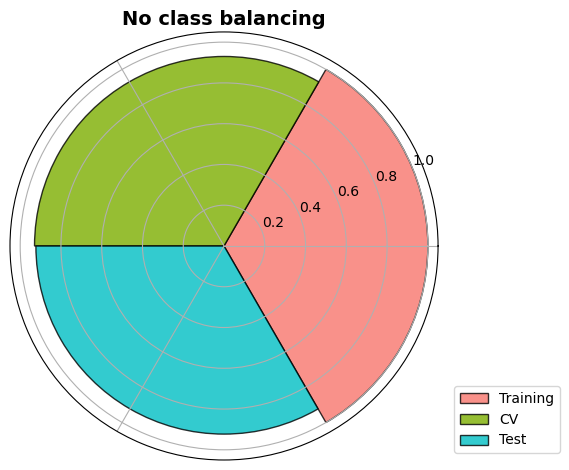

In [78]:
# No class balancing

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors

data = df.iloc[0,:]

N = len(data)
theta = np.linspace(0.0, 2 * np.pi, N, endpoint=False)
radii = data
width = 2 * np.pi / N

ax = plt.subplot(111, polar=True)

bars = ax.bar(theta, radii, width=width, bottom=0.0)
ax.xaxis.set_ticks(theta)

#ax.set_xticklabels(radii.index, fontsize=14)
ax.set_xticklabels(['','',''])
ax.tick_params(axis='x', which='major')

cmap = colors.ListedColormap(['#F8766D', '#7CAE00', '#00BFC4'])

for r, bar in zip(theta, bars):
    #bar.set_facecolor(plt.cm.hsv(r / np.pi / 2))
    bar.set_facecolor(cmap(r / np.pi / 2))
    bar.set_alpha(0.8)
    bar.set_edgecolor('black')

ax.legend(bars, radii.index, loc='lower right', bbox_to_anchor=(1.3, 0) )

ax.set_title('No class balancing', fontsize=14, fontweight='bold', pad=5) # Training set

plt.tight_layout()
plt.savefig('Figure_polarplot_MCC_df1.pdf')

In [86]:
# Custom function for making polar plot

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors

def make_polar_plot(data, plotlabel):
  N = len(data)
  theta = np.linspace(0.0, 2 * np.pi, N, endpoint=False)
  radii = data
  width = 2 * np.pi / N

  ax = plt.subplot(111, polar=True)

  bars = ax.bar(theta, radii, width=width, bottom=0.0)
  ax.xaxis.set_ticks(theta)

  #ax.set_xticklabels(radii.index, fontsize=14)
  ax.set_xticklabels(['','',''])
  ax.tick_params(axis='x', which='major')

  cmap = colors.ListedColormap(['#F8766D', '#7CAE00', '#00BFC4'])

  for r, bar in zip(theta, bars):
      #bar.set_facecolor(plt.cm.hsv(r / np.pi / 2))
      bar.set_facecolor(cmap(r / np.pi / 2))
      bar.set_alpha(0.7)
      bar.set_edgecolor('black')

  ax.legend(bars, radii.index, loc='lower right', bbox_to_anchor=(1.3, 0) )

  ax.set_title(plotlabel, fontsize=14, fontweight='bold', pad=5) # Training set

  txt = plotlabel.split()
  txt2 = [x.capitalize() for x in txt]
  txt3 = ''.join(txt2)

  plt.tight_layout()
  plt.savefig(f'Figure_polarplot_MCC_{txt3}.pdf')
     

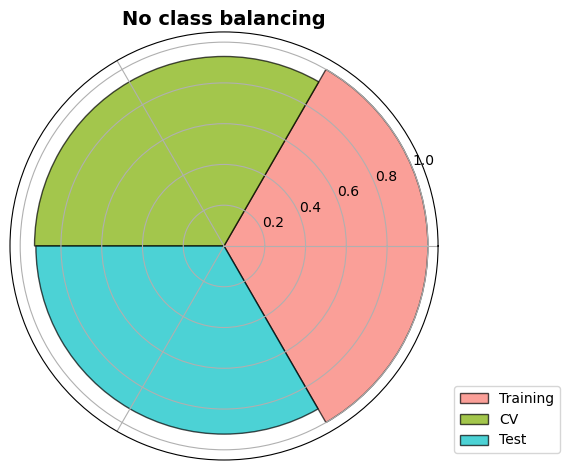

In [88]:
# No class balancing
data = df.iloc[0,:]

make_polar_plot(data, 'No class balancing')

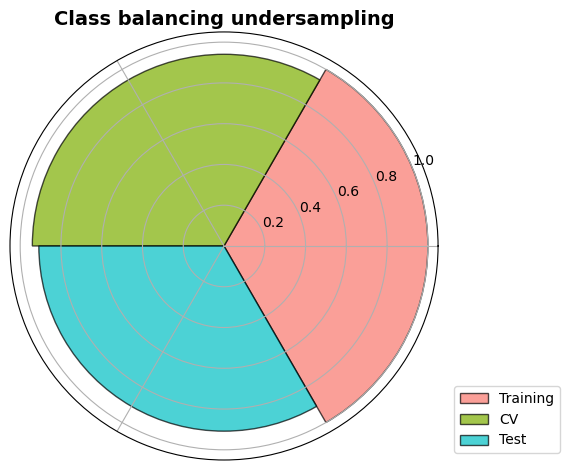

In [89]:
# Class balancing (undersampling)
data = df.iloc[1,:]

make_polar_plot(data, 'Class balancing undersampling')

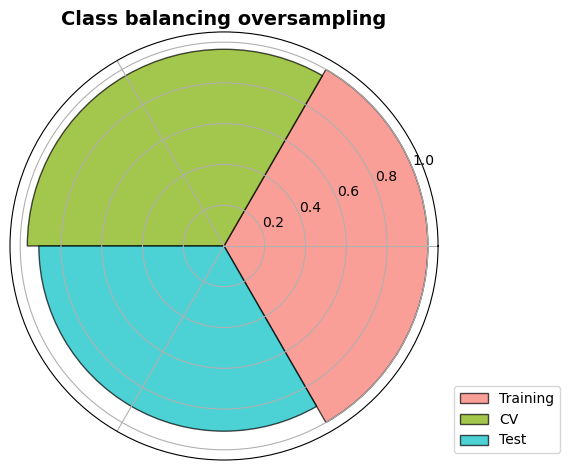

In [90]:
data = df.iloc[2,:]

make_polar_plot(data, 'Class balancing oversampling')

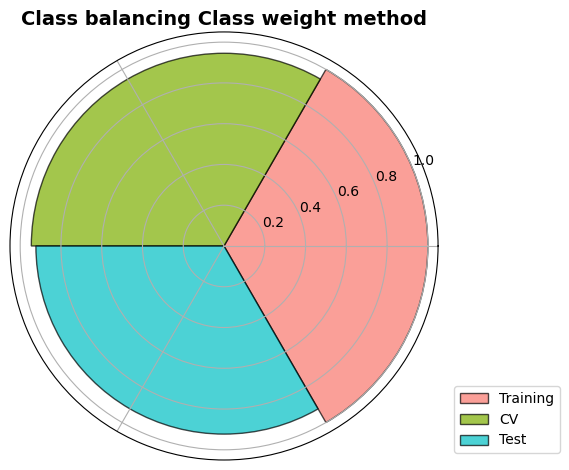

In [91]:
data = df.iloc[3,:]

make_polar_plot(data, 'Class balancing Class weight method')

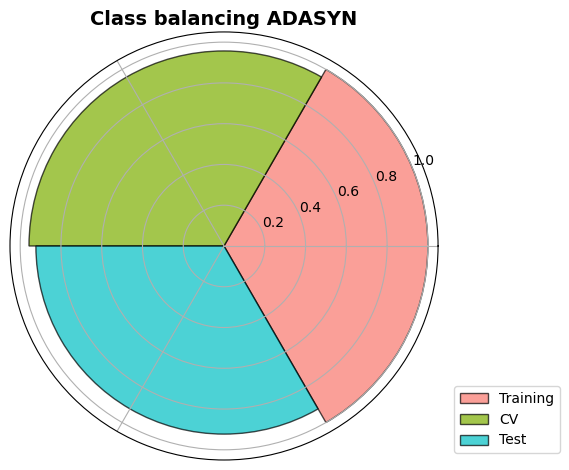

In [92]:
data = df.iloc[4,:]

make_polar_plot(data, 'Class balancing ADASYN')

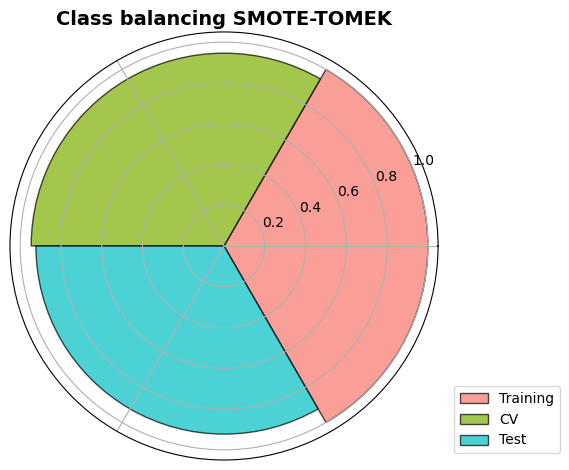

In [93]:
data = df.iloc[5,:]

make_polar_plot(data, 'Class balancing SMOTE-TOMEK')

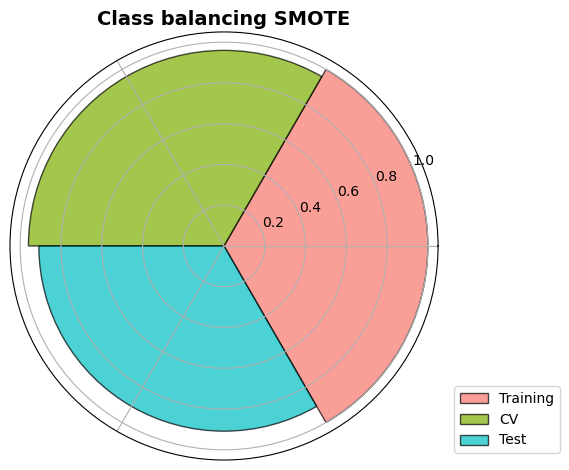

In [94]:
data = df.iloc[6,:]

make_polar_plot(data, 'Class balancing SMOTE')

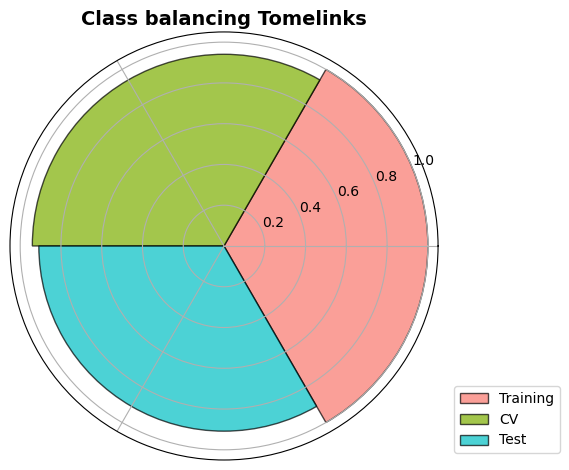

In [95]:
data = df.iloc[7,:]

make_polar_plot(data, 'Class balancing Tomelinks')

In [50]:
y_train.value_counts()

2    366
4    193
Name: Classes, dtype: int64

In [49]:
y_adasyn.value_counts()

2    366
4    365
Name: Classes, dtype: int64

In [53]:
print('No. of records added:',y_adasyn.shape[0] - y_train.shape[0])

No. of records added: 172


In [103]:
print('------------Training Set------------------')
print(X_train.shape)
print(y_train.shape)

print('------------Test Set------------------')
print(X_test.shape)
print(y_test.shape)

------------Training Set------------------
(372, 9)
(372,)
------------Test Set------------------
(93, 9)
(93,)


In [20]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train[['Clump_Thickness', 'Uniformity_Cell_Size',
       'Uniformity_CellNaNShape', 'Marginal_Adhesion', 'Single_Epithelial',
       'Bare_Nuclei', 'Bland_Chromatin', 'Normal_Chromatin', 'Mitoses']] = scaler.fit_transform(X_train[['Clump_Thickness', 'Uniformity_Cell_Size',
       'Uniformity_CellNaNShape', 'Marginal_Adhesion', 'Single_Epithelial',
       'Bare_Nuclei', 'Bland_Chromatin', 'Normal_Chromatin', 'Mitoses']])
X_train.head()

,Clump_Thickness,Uniformity_Cell_Size,Uniformity_CellNaNShape,Marginal_Adhesion,Single_Epithelial,Bare_Nuclei,Bland_Chromatin,Normal_Chromatin,Mitoses
115,0.000000,0.000000,0.000000,0.000000,0.111111,0.468609,0.000000,0.000000,0.0
336,0.555556,0.444444,0.444444,0.777778,0.333333,1.000000,0.222222,0.333333,0.0
15,0.666667,0.333333,0.555556,0.333333,0.555556,0.043495,0.333333,0.222222,0.0
574,1.000000,0.888889,0.666667,0.222222,0.333333,0.149774,0.666667,0.666667,0.0
75,0.000000,0.000000,0.111111,0.000000,0.111111,0.149774,0.333333,0.111111,0.0


In [21]:
X_test[['Clump_Thickness', 'Uniformity_Cell_Size',
       'Uniformity_CellNaNShape', 'Marginal_Adhesion', 'Single_Epithelial',
       'Bare_Nuclei', 'Bland_Chromatin', 'Normal_Chromatin', 'Mitoses']] = scaler.transform(X_test[['Clump_Thickness', 'Uniformity_Cell_Size',
       'Uniformity_CellNaNShape', 'Marginal_Adhesion', 'Single_Epithelial',
       'Bare_Nuclei', 'Bland_Chromatin', 'Normal_Chromatin', 'Mitoses']])
X_test.head()

,Clump_Thickness,Uniformity_Cell_Size,Uniformity_CellNaNShape,Marginal_Adhesion,Single_Epithelial,Bare_Nuclei,Bland_Chromatin,Normal_Chromatin,Mitoses
42,0.555556,1.000000,1.000000,0.111111,0.777778,1.000000,0.666667,0.222222,0.222222
71,0.555556,1.000000,0.111111,0.777778,1.000000,0.149774,0.666667,0.777778,1.000000
23,0.777778,0.333333,0.444444,0.000000,0.111111,0.507608,0.666667,0.222222,0.000000
260,1.000000,0.444444,0.777778,1.000000,0.222222,1.000000,0.444444,0.000000,0.222222
165,0.333333,0.000000,0.000000,0.000000,0.111111,0.149774,0.222222,0.111111,0.000000


In [67]:
dt.shape

(691, 10)

In [33]:
from sklearn import model_selection
from sklearn.model_selection import cross_val_score
from xgboost import XGBClassifier
# function initializing baseline machine learning models
def GetBasedModel():
    basedModels = []
    basedModels.append(('LR_L2'   , LogisticRegression(penalty='l2')))
    basedModels.append(('LDA'  , LinearDiscriminantAnalysis()))
    basedModels.append(('KNN7'  , KNeighborsClassifier(7)))
    basedModels.append(('KNN5'  , KNeighborsClassifier(5)))
    basedModels.append(('KNN9'  , KNeighborsClassifier(9)))
    basedModels.append(('KNN11'  , KNeighborsClassifier(11)))
    basedModels.append(('CART' , DecisionTreeClassifier()))
    basedModels.append(('NB'   , GaussianNB()))
    basedModels.append(('SVM RBF'  , SVC(kernel='rbf',gamma='auto',probability=True)))
    basedModels.append(('AB'   , AdaBoostClassifier()))
    basedModels.append(('GBM'  , GradientBoostingClassifier(n_estimators=100,max_features='sqrt')))
    basedModels.append(('RF_Ent100'   , RandomForestClassifier(criterion='entropy',n_estimators=100)))
    basedModels.append(('RF_Gini100'   , RandomForestClassifier(criterion='gini',n_estimators=100)))
    basedModels.append(('ET100'   , ExtraTreesClassifier(n_estimators= 100)))
    basedModels.append(('ET500'   , ExtraTreesClassifier(n_estimators= 500)))
    basedModels.append(('MLP', MLPClassifier()))
    basedModels.append(('SGD3000', SGDClassifier(max_iter=1000, tol=1e-4)))
    basedModels.append(('XGB_2000', xgb.XGBClassifier(n_estimators= 2000)))
    basedModels.append(('XGB_500', xgb.XGBClassifier(n_estimators= 500)))
    basedModels.append(('XGB_100', xgb.XGBClassifier(n_estimators= 100)))
    basedModels.append(('XGB_1000', xgb.XGBClassifier(n_estimators= 1000)))
    basedModels.append(('ET1000'   , ExtraTreesClassifier(n_estimators= 1000)))
    
    return basedModels

# function for performing 10-fold cross validation of all the baseline models
def BasedLine2(X_ros, y_ros,models):
    # Test options and evaluation metric
    num_folds = 10
    scoring = 'accuracy'
    seed = 7
    results = []
    names = []
    for name, model in models:
        kfold = model_selection.KFold(n_splits=10, random_state=None)
        cv_results = model_selection.cross_val_score(model, X_ros, y_ros, cv=kfold, scoring=scoring)
        results.append(cv_results)
        names.append(name)
        msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
        print(msg)
         
        
    return results,msg

In [34]:
models = GetBasedModel()
names,results = BasedLine2(X_ros, y_ros,models)

LR_L2: 0.960876 (0.023175)
LDA: 0.952484 (0.025910)
KNN7: 0.963693 (0.025023)
KNN5: 0.967879 (0.020732)
KNN9: 0.966491 (0.023470)
KNN11: 0.966510 (0.026528)
CART: 0.956749 (0.029607)
NB: 0.962363 (0.025650)
SVM RBF: 0.966530 (0.020896)
AB: 0.963654 (0.021882)
GBM: 0.979049 (0.021878)
RF_Ent100: 0.979030 (0.022833)
RF_Gini100: 0.979069 (0.018971)
ET100: 0.977680 (0.019907)
ET500: 0.980458 (0.017879)
MLP: 0.963732 (0.026532)
SGD3000: 0.959429 (0.028991)
XGB_2000: 0.970657 (0.028342)
XGB_500: 0.970696 (0.023777)
XGB_100: 0.974863 (0.023268)
XGB_1000: 0.972085 (0.024227)
ET1000: 0.980458 (0.017879)


In [35]:
GBM = GradientBoostingClassifier(n_estimators=100)
GBM.fit(X_ros, y_ros)
y_pred_GBM = GBM.predict(X_test)

In [36]:
rf_ent = RandomForestClassifier(criterion='entropy',n_estimators=100)
rf_ent.fit(X_ros, y_ros)
y_pred_rfe = rf_ent.predict(X_test)

In [47]:
rf_entGini = RandomForestClassifier(criterion='gini',n_estimators=100)
rf_entGini.fit(X_ros, y_ros)
y_pred_rfeGini = rf_entGini.predict(X_test)

In [38]:
kNN9 = KNeighborsClassifier(9)
kNN9.fit(X_ros,y_ros)
y_pred_KNN9 = kNN9.predict(X_test)

In [39]:
ET100 = ExtraTreesClassifier(n_estimators= 100)
ET100.fit(X_ros,y_ros)
y_pred_ET100 = ET100.predict(X_test)

In [40]:
ET500 = ExtraTreesClassifier(n_estimators= 500)
ET500.fit(X_ros,y_ros)
y_pred_ET500 = ET500.predict(X_test)

In [41]:
et_1000 = ExtraTreesClassifier(n_estimators= 1000)
et_1000.fit(X_ros,y_ros)
y_pred_et_1000 = et_1000.predict(X_test)

,Model,Accuracy,Precision,Sensitivity,Specificity,F1 Score,ROC,Log_Loss,mathew_corrcoef
0,GMB,0.971223,0.954545,0.954545,0.978947,0.954545,0.966746,1.037227,0.933493


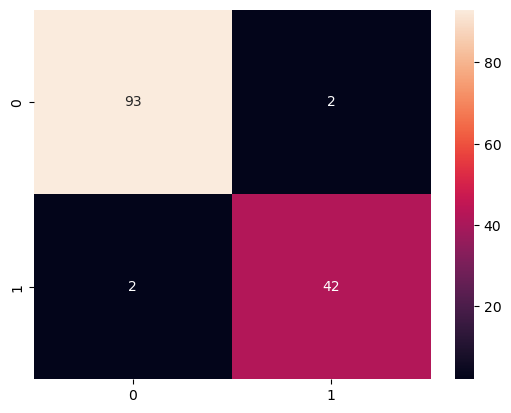

In [52]:
CM=confusion_matrix(y_test,y_pred_GBM)
sns.heatmap(CM, annot=True)

TN = CM[0][0]
FN = CM[1][0]
TP = CM[1][1]
FP = CM[0][1]
specificity = TN/(TN+FP)
loss_log = log_loss(y_test, y_pred_GBM)
acc= accuracy_score(y_test, y_pred_GBM)
roc=roc_auc_score(y_test, y_pred_GBM)
prec = precision_score(y_test, y_pred_GBM)
f1 = f1_score(y_test, y_pred_GBM)
rec = recall_score(y_test, y_pred_GBM)
mathew = matthews_corrcoef(y_test, y_pred_GBM)
model_results =pd.DataFrame([['GMB',acc, prec,rec,specificity, f1,roc, loss_log,mathew]],
               columns = ['Model', 'Accuracy','Precision', 'Sensitivity','Specificity', 'F1 Score','ROC','Log_Loss','mathew_corrcoef'])

model_results

In [23]:
data = {        'EXtra tree classifier': y_pred_et_1000,
                'RF': y_pred_rfe,
                'kNN9': y_pred_KNN9,  
                'RFGini': y_pred_rfeGini, 
                'ET100': y_pred_ET100, 
                'ET500': y_pred_ET500, 
                'GBM': y_pred_GBM }

models = pd.DataFrame(data) 
 
for column in models:
    CM=confusion_matrix(y_test,models[column])
    
    TN = CM[0][0]
    FN = CM[1][0]
    TP = CM[1][1]
    FP = CM[0][1]
    specificity = TN/(TN+FP)
    loss_log = log_loss(y_test, models[column])
    acc= accuracy_score(y_test, models[column])
    roc=roc_auc_score(y_test, models[column])
    prec = precision_score(y_test, models[column])
    rec = recall_score(y_test, models[column])
    f1 = f1_score(y_test, models[column])
    
    mathew = matthews_corrcoef(y_test, models[column])
    results =pd.DataFrame([[column,acc, prec,rec,specificity, f1,roc, loss_log,mathew]],
               columns = ['Model', 'Accuracy','Precision','Sensitivity','Specificity', 'F1 Score','ROC','Log_Loss','mathew_corrcoef'])
    model_results = model_results.append(results, ignore_index = True)

model_results

,Model,Accuracy,Precision,Sensitivity,Specificity,F1 Score,ROC,Log_Loss,mathew_corrcoef
0,GMB,0.971223,0.954545,0.954545,0.978947,0.954545,0.966746,1.037227,0.933493
1,EXtra tree classifier,0.992806,0.977778,1.000000,0.989474,0.988764,0.994737,0.259307,0.983608
2,RF,0.985612,0.977273,0.977273,0.989474,0.977273,0.983373,0.518614,0.966746
3,kNN9,0.992806,0.977778,1.000000,0.989474,0.988764,0.994737,0.259307,0.983608
4,RFGini,0.985612,0.977273,0.977273,0.989474,0.977273,0.983373,0.518614,0.966746
5,ET100,0.992806,0.977778,1.000000,0.989474,0.988764,0.994737,0.259307,0.983608
6,ET500,0.985612,0.977273,0.977273,0.989474,0.977273,0.983373,0.518614,0.966746
7,GBM,0.971223,0.954545,0.954545,0.978947,0.954545,0.966746,1.037227,0.933493


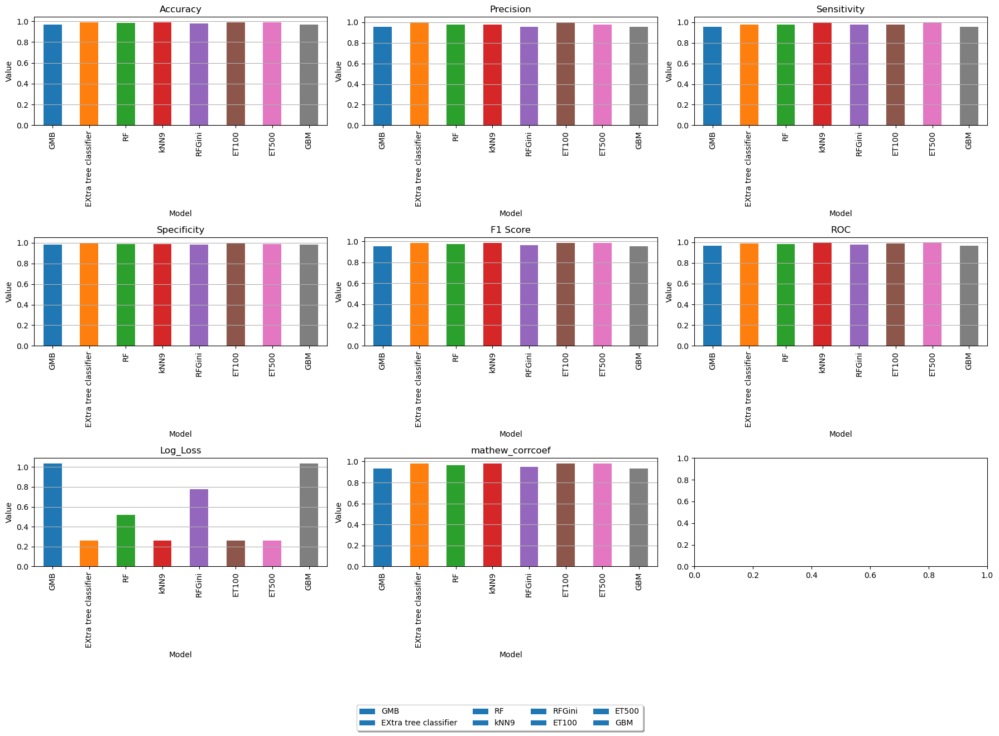

In [125]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming the table is stored as a DataFrame named 'df'

df = pd.DataFrame({
    "Model": ["GMB", "EXtra tree classifier", "RF", "kNN9", "RFGini", "ET100", "ET500", "GBM"],
    "Accuracy": [0.971223, 0.992806, 0.985612, 0.992806, 0.978417, 0.992806, 0.992806, 0.971223],
    "Precision": [0.954545, 1.000000, 0.977273, 0.977778, 0.955556, 1.000000, 0.977778, 0.954545],
    "Sensitivity": [0.954545, 0.977273, 0.977273, 1.000000, 0.977273, 0.977273, 1.000000, 0.954545],
    "Specificity": [0.978947, 1.000000, 0.989474, 0.989474, 0.978947, 1.000000, 0.989474, 0.978947],
    "F1 Score": [0.954545, 0.988506, 0.977273, 0.988764, 0.966292, 0.988506, 0.988764, 0.954545],
    "ROC": [0.966746, 0.988636, 0.983373, 0.994737, 0.978110, 0.988636, 0.994737, 0.966746],
    "Log_Loss": [1.037227, 0.259307, 0.518614, 0.259307, 0.777921, 0.259307, 0.259307, 1.037227],
    "mathew_corrcoef": [0.933493, 0.983409, 0.966746, 0.983608, 0.950552, 0.983409, 0.983608, 0.933493]
})

# Set the index to the 'Model' column
df.set_index('Model', inplace=True)

# Plotting
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 12))

for i, (column, ax) in enumerate(zip(df.columns, axes.flatten())):
    df[column].plot(kind='bar', ax=ax, color=plt.cm.tab10.colors)
    ax.set_title(column)
    ax.set_ylabel('Value')
    ax.set_xlabel('Model')
    ax.grid(axis='y')

# Add legend
fig.legend(df.index, loc='upper center', bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=4)

plt.tight_layout()
plt.show()


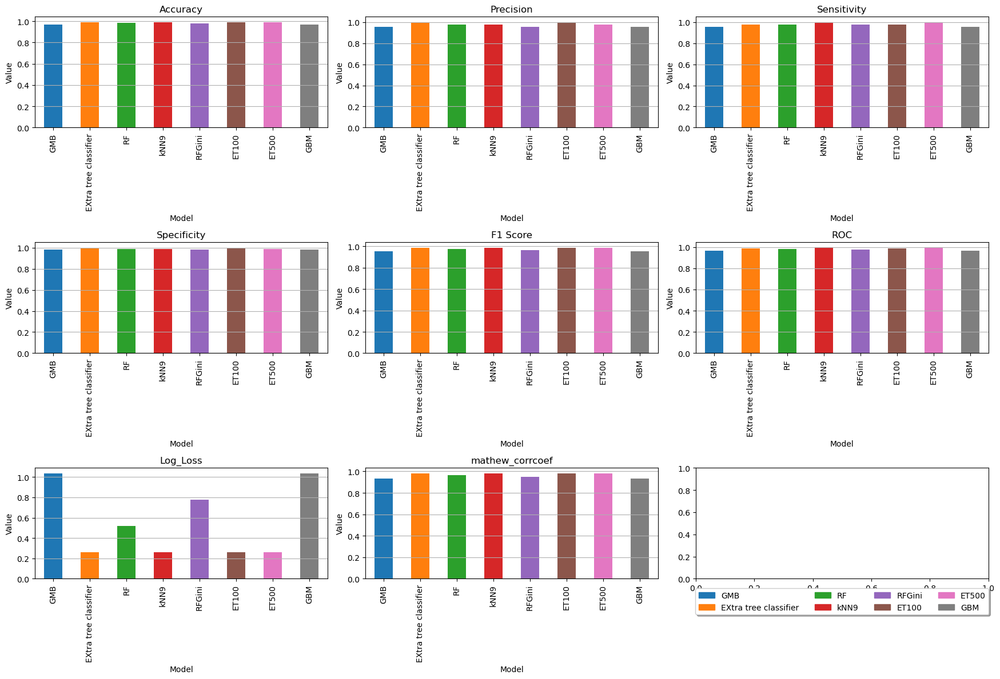

In [126]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming the table is stored as a DataFrame named 'df'

df = pd.DataFrame({
    "Model": ["GMB", "EXtra tree classifier", "RF", "kNN9", "RFGini", "ET100", "ET500", "GBM"],
    "Accuracy": [0.971223, 0.992806, 0.985612, 0.992806, 0.978417, 0.992806, 0.992806, 0.971223],
    "Precision": [0.954545, 1.000000, 0.977273, 0.977778, 0.955556, 1.000000, 0.977778, 0.954545],
    "Sensitivity": [0.954545, 0.977273, 0.977273, 1.000000, 0.977273, 0.977273, 1.000000, 0.954545],
    "Specificity": [0.978947, 1.000000, 0.989474, 0.989474, 0.978947, 1.000000, 0.989474, 0.978947],
    "F1 Score": [0.954545, 0.988506, 0.977273, 0.988764, 0.966292, 0.988506, 0.988764, 0.954545],
    "ROC": [0.966746, 0.988636, 0.983373, 0.994737, 0.978110, 0.988636, 0.994737, 0.966746],
    "Log_Loss": [1.037227, 0.259307, 0.518614, 0.259307, 0.777921, 0.259307, 0.259307, 1.037227],
    "mathew_corrcoef": [0.933493, 0.983409, 0.966746, 0.983608, 0.950552, 0.983409, 0.983608, 0.933493]
})

# Set the index to the 'Model' column
df.set_index('Model', inplace=True)

# Define colors for each model
colors = plt.cm.tab10.colors[:len(df)]

# Plotting
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(18, 12))

for i, (column, ax) in enumerate(zip(df.columns, axes.flatten())):
    df[column].plot(kind='bar', ax=ax, color=colors)
    ax.set_title(column)
    ax.set_ylabel('Value')
    ax.set_xlabel('Model')
    ax.grid(axis='y')

# Add legend
handles = [plt.Rectangle((0,0),1,1, color=colors[i]) for i in range(len(df))]
plt.legend(handles, df.index, loc='upper center', bbox_to_anchor=(0.5, -0.05), fancybox=True, shadow=True, ncol=4)

plt.tight_layout()
plt.show()


In [128]:
dt.columns

Index(['Clump_Thickness', 'Uniformity_Cell_Size', 'UniformityofCellShape',
       'MarginalAdhesion', 'Single_Epithelial', 'BareNuclei', 'BlandChromatin',
       'NormaChromatin', 'Mitoses', 'Classes'],
      dtype='object')

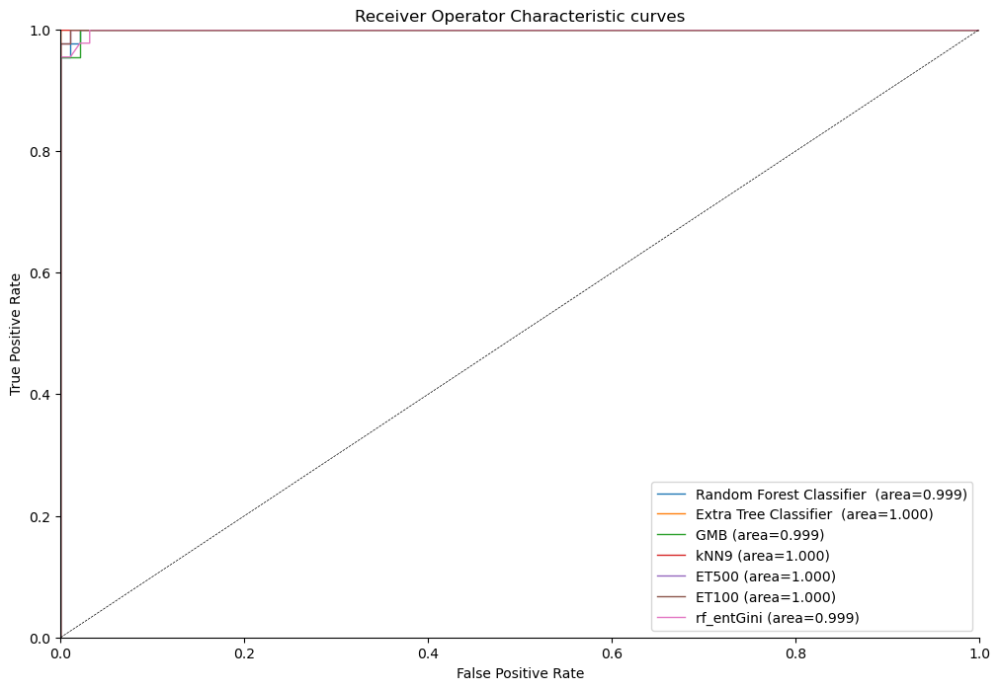

In [68]:
def roc_auc_plot(y_true, y_proba, label=' ', l='-', lw=1.0):
    from sklearn.metrics import roc_curve, roc_auc_score
    fpr, tpr, _ = roc_curve(y_true, y_proba[:,1])
    ax.plot(fpr, tpr, linestyle=l, linewidth=lw,
            label="%s (area=%.3f)"%(label,roc_auc_score(y_true, y_proba[:,1])))

f, ax = plt.subplots(figsize=(12,8))


roc_auc_plot(y_test,rf_ent.predict_proba(X_test),label='Random Forest Classifier ',l='-')
roc_auc_plot(y_test,et_1000.predict_proba(X_test),label='Extra Tree Classifier ',l='-')
roc_auc_plot(y_test,GBM.predict_proba(X_test),label='GMB',l='-')
roc_auc_plot(y_test,kNN9.predict_proba(X_test),label='kNN9',l='-')
roc_auc_plot(y_test,ET500.predict_proba(X_test),label='ET500',l='-')
roc_auc_plot(y_test,ET100.predict_proba(X_test),label='ET100',l='-')
roc_auc_plot(y_test,rf_entGini.predict_proba(X_test),label='rf_entGini',l='-')

ax.plot([0,1], [0,1], color='k', linewidth=0.5, linestyle='--', 
        )    
ax.legend(loc="lower right")    
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.set_xlim([0, 1])
ax.set_ylim([0, 1])
ax.set_title('Receiver Operator Characteristic curves')
sns.despine()

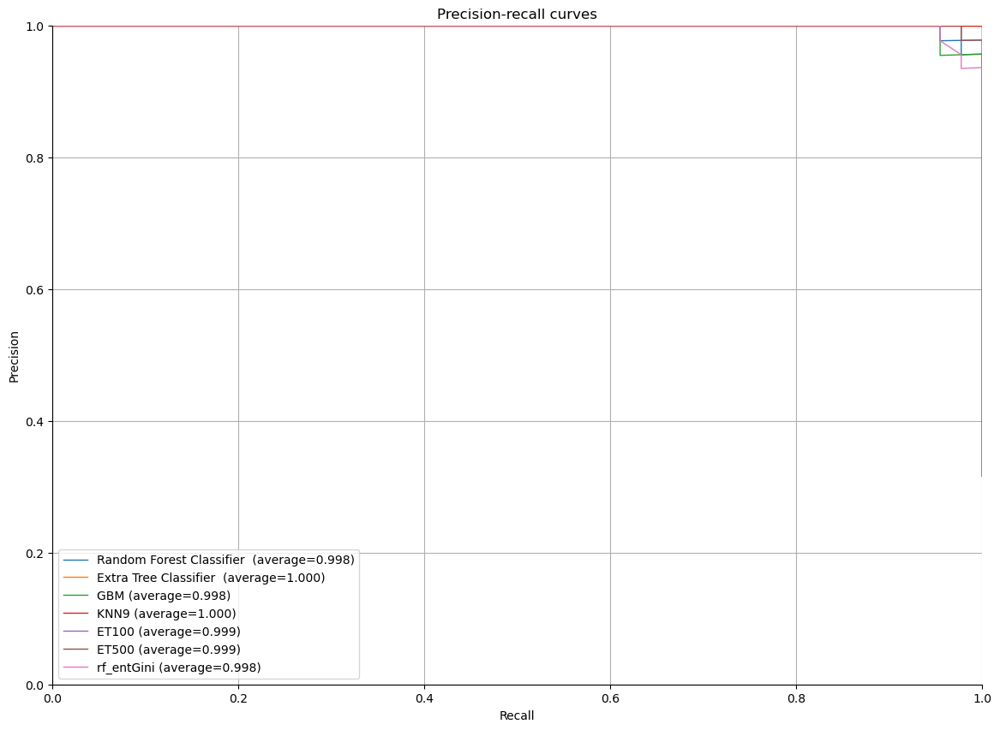

In [69]:
def precision_recall_plot(y_true, y_proba, label=' ', l='-', lw=1.0):
    from sklearn.metrics import precision_recall_curve, average_precision_score
    precision, recall, _ = precision_recall_curve(y_test,
                                                  y_proba[:,1])
    average_precision = average_precision_score(y_test, y_proba[:,1],
                                                     average="micro")
    ax.plot(recall, precision, label='%s (average=%.3f)'%(label,average_precision),
            linestyle=l, linewidth=lw)

f, ax = plt.subplots(figsize=(14,10))

precision_recall_plot(y_test,rf_ent.predict_proba(X_test),label='Random Forest Classifier ',l='-')
precision_recall_plot(y_test,et_1000.predict_proba(X_test),label='Extra Tree Classifier ',l='-')
precision_recall_plot(y_test,GBM.predict_proba(X_test),label='GBM',l='-')
precision_recall_plot(y_test,kNN9.predict_proba(X_test),label='KNN9',l='-')
precision_recall_plot(y_test,ET100.predict_proba(X_test),label='ET100',l='-')
precision_recall_plot(y_test,ET500.predict_proba(X_test),label='ET500',l='-')
precision_recall_plot(y_test,rf_entGini.predict_proba(X_test),label='rf_entGini',l='-')
ax.set_xlabel('Recall')
ax.set_ylabel('Precision')
ax.legend(loc="lower left")
ax.grid(True)
ax.set_xlim([0, 1])
ax.set_ylim([0, 1])
ax.set_title('Precision-recall curves')
sns.despine()

In [12]:
X=dt.drop('Classes',axis=1)
y=dt['Classes']

In [24]:
import joblib

In [14]:
from sklearn.ensemble import RandomForestClassifier

In [25]:
rf_ent = RandomForestClassifier()
rf_ent.fit(X,y)

RandomForestClassifier()

In [44]:
dt.columns

Index(['Clump_Thickness', 'Uniformity_Cell_Size', 'Uniformity_CellNaNShape',
       'Marginal_Adhesion', 'Single_Epithelial', 'Bare_Nuclei',
       'Bland_Chromatin', 'Normal_Chromatin', 'Mitoses', 'Classes'],
      dtype='object')

In [13]:
import shap

In [14]:
X_ros

NameError: name 'X_ros' is not defined

In [53]:
ex = shap.KernelExplainer(et_1000.predict, shap.sample(X_ros,100))


  0%|          | 0/139 [00:00<?, ?it/s]

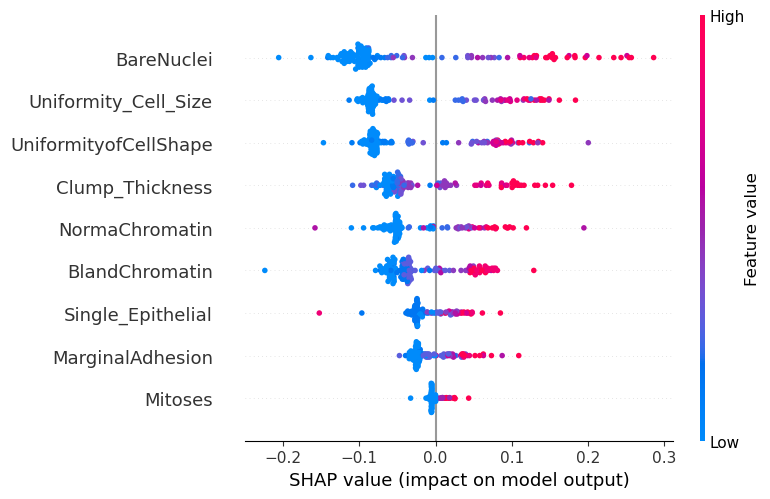

In [67]:
shap.initjs()
shap_values = ex.shap_values(X_test)
shap.summary_plot(shap_values, X_test)


In [55]:
X_test

,Clump_Thickness,Uniformity_Cell_Size,UniformityofCellShape,MarginalAdhesion,Single_Epithelial,BareNuclei,BlandChromatin,NormaChromatin,Mitoses
594,4,8,6,3,4,10.0,7,1,1
303,1,1,1,1,2,1.0,3,1,1
443,1,1,1,1,2,2.0,1,1,1
202,1,1,1,1,2,1.0,3,1,1
309,3,1,1,1,2,5.0,5,1,1
...,...,...,...,...,...,...,...,...,...
256,3,1,1,1,2,1.0,1,1,1
20,7,3,2,10,5,10.0,5,4,4
155,5,5,5,6,3,10.0,3,1,1
473,4,1,1,1,2,1.0,1,1,1


In [64]:
X.columns

Index(['Clump_Thickness', 'Uniformity_Cell_Size', 'UniformityofCellShape',
       'MarginalAdhesion', 'Single_Epithelial', 'BareNuclei', 'BlandChromatin',
       'NormaChromatin', 'Mitoses'],
      dtype='object')

In [72]:
shap.initjs()
shap_values = ex.shap_values(X_test.iloc[0,:])
shap.force_plot(ex.expected_value, shap_values, X_test.iloc[0,:])

In [71]:
shap.initjs()
shap_values = ex.shap_values(X_test.iloc[2,:])
shap.force_plot(ex.expected_value, shap_values, X_test.iloc[2,:])

In [106]:
shap.initjs()
shap_values = ex.shap_values(X_test.iloc[1,:])
shap.force_plot(ex.expected_value, shap_values, X_test.iloc[1,:])

In [107]:
shap.initjs()
shap_values = ex.shap_values(X_test.iloc[3,:])
shap.force_plot(ex.expected_value, shap_values, X_test.iloc[3,:])

In [78]:
shap.initjs()
shap_values = ex.shap_values(X_test.iloc[135,:])
shap.force_plot(ex.expected_value, shap_values, X_test.iloc[135,:])

In [76]:
shap.initjs()
shap_values = ex.shap_values(X_test.iloc[134,:])
shap.force_plot(ex.expected_value, shap_values, X_test.iloc[134,:])

In [116]:
X_test

,Clump_Thickness,Uniformity_Cell_Size,UniformityofCellShape,MarginalAdhesion,Single_Epithelial,BareNuclei,BlandChromatin,NormaChromatin,Mitoses
594,4,8,6,3,4,10.0,7,1,1
303,1,1,1,1,2,1.0,3,1,1
443,1,1,1,1,2,2.0,1,1,1
202,1,1,1,1,2,1.0,3,1,1
309,3,1,1,1,2,5.0,5,1,1
...,...,...,...,...,...,...,...,...,...
256,3,1,1,1,2,1.0,1,1,1
20,7,3,2,10,5,10.0,5,4,4
155,5,5,5,6,3,10.0,3,1,1
473,4,1,1,1,2,1.0,1,1,1


In [ ]:
plot_type="violin"

<Axes: >

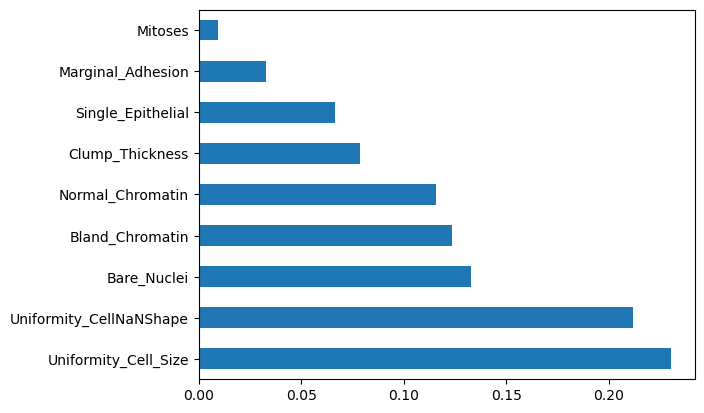

In [23]:
feat_importances = pd.Series(rf_ent.feature_importances_, index=X_train.columns)
feat_importances.nlargest(20).plot(kind='barh')

In [49]:
import shap

In [24]:
shap_values[0]

array([[ 0.03036754, -0.03036754],
       [-0.09990757,  0.09990757],
       [-0.11407983,  0.11407983],
       [ 0.00946278, -0.00946278],
       [-0.03835494,  0.03835494],
       [-0.09861005,  0.09861005],
       [-0.08604255,  0.08604255],
       [-0.03850826,  0.03850826],
       [-0.00419272,  0.00419272]])

In [56]:
new_data = pd.DataFrame({
    'Clump_Thickness':10, 
    'Uniformity_Cell_Size':10, 
    'Uniformity_CellNaNShape':10,
    'Marginal_Adhesion':10,
    'Single_Epithelial':10, 
    'Bare_Nuclei':6,
    'Bland_Chromatin':8, 
    'Normal_Chromatin':10, 
    'Mitoses':10,
},index=[0])

In [57]:
new_data

,Clump_Thickness,Uniformity_Cell_Size,Uniformity_CellNaNShape,Marginal_Adhesion,Single_Epithelial,Bare_Nuclei,Bland_Chromatin,Normal_Chromatin,Mitoses
0,10,10,10,10,10,6,8,10,10


In [77]:
p = rf_ent.predict(new_data)
if p[0]==0:
    print("According to Model No Breast Cancer")
else:
    print("Presence of Breast Cancer")

Presence of Breast Cancer


In [41]:
import joblib

In [42]:
joblib.dump( rf_ent,'model_joblib_BreastCancer')

['model_joblib_BreastCancer']

In [43]:
model = joblib.load('model_joblib_BreastCancer')

In [81]:
model.predict(new_data)

array([1], dtype=int64)

In [16]:
from tkinter import *
import joblib
import numpy as np
from sklearn import *
def show_entry_fields():
    p1=int(e1.get())
    p2=int(e2.get())
    p3=int(e3.get())
    p4=int(e4.get())
    p5=int(e5.get())
    p6=int(e6.get())
    p7=int(e7.get())
    p8=int(e8.get())
    p9=int(e9.get())
    model = joblib.load('model_joblib_BreastCancer')
    result=model.predict([[p1,p2,p3,p4,p5,p6,p7,p8,p9]])
    
    if result == 0:
        Label(master, text="Abscence of Breast Disease").grid(row=31)
    else:
        Label(master, text="prescence of Heart Disease").grid(row=31)
    
    
master = Tk()
master.title("Breast Cancer Disease Prediction System")


label = Label(master, text = "Breast Cancer"
                          , bg = "black", fg = "white"). \
                               grid(row=0,columnspan=2)


Label(master, text="Enter Value of Clump_thickness").grid(row=1)
Label(master, text="Enter Value of Unformity of Cell Size").grid(row=2)
Label(master, text="Unformity of Cell Shape").grid(row=3)
Label(master, text="Enter Value of marginal adhesion").grid(row=4)
Label(master, text="Enter Value of Single epithelilial").grid(row=5)
Label(master, text="Enter Value of bare nuclei").grid(row=6)
Label(master, text="Enter Value of bland chromatin").grid(row=7)
Label(master, text="Enter Value of normal chromatin").grid(row=8)
Label(master, text="Enter Value of Mitosis").grid(row=9)




e1 = Entry(master)
e2 = Entry(master)
e3 = Entry(master)
e4 = Entry(master)
e5 = Entry(master)
e6 = Entry(master)
e7 = Entry(master)
e8 = Entry(master)
e9 = Entry(master)


e1.grid(row=1, column=1)
e2.grid(row=2, column=1)
e3.grid(row=3, column=1)
e4.grid(row=4, column=1)
e5.grid(row=5, column=1)
e6.grid(row=6, column=1)
e7.grid(row=7, column=1)
e8.grid(row=8, column=1)
e9.grid(row=9, column=1)




Button(master, text='Predict', command=show_entry_fields).grid()

mainloop()

In [11]:
from tkinter import *
from tkinter import ttk

import joblib
import matplotlib.pyplot as plt

def show_entry_fields():
    # Extracting input values for breast cancer prediction
    p1 = int(e1.get())
    p2 = int(e2.get())
    p3 = int(e3.get())
    p4 = int(e4.get())
    p5 = int(e5.get())
    p6 = int(e6.get())
    p7 = int(e7.get())
    p8 = int(e8.get())
    p9 = int(e9.get())
    
    # Example of fetching input values for Name, DOB, Registration Number, and Date
    name = name_entry.get()
    dob = dob_entry.get()
    reg_number = reg_entry.get()
    date = date_entry.get()
    
    model = joblib.load('model_joblib_BreastCancer')
    result = model.predict([[p1, p2, p3, p4, p5, p6, p7, p8, p9]])
    
    if result == 0:
        result_label.config(text="Absence of Breast Disease", fg="green")
        advice_label.config(text="Keep up with regular check-ups.\nMaintain a healthy lifestyle with exercise and good nutrition.\nPerform monthly self-exams.", fg="green")
    else:
        result_label.config(text="Presence of Breast Disease", fg="red")
        advice_label.config(text="Seek Medical Help:\nSchedule an urgent appointment with a healthcare provider.\nExplore treatment options with a specialist.\nSeek emotional support if needed.", fg="red")
    
    # Generate shape summary plot based on model prediction and user input
    if result == 0:
        image_path = "Images/shape_summary_plot_absence.png"  # Change this to the path of your plot for absence
    else:
        image_path = "Images/shape_summary_plot_presence.png"  # Change this to the path of your plot for presence
    
    plt.clf()
    plt.imshow(plt.imread(image_path))
    plt.axis('off')
    plt.show()

root = Tk()
root.title("Breast Cancer Prediction")
root.configure(bg="#f9cdad")

# Add a header image
header_image = PhotoImage(file="C:/Users/PC-USER/Desktop/Breast Cancer Diagnosis/Images/Presentation9.png")  # Change "header_image.png" to the path of your header image
header_label = Label(root, image=header_image, bg="#f9cdad")
header_label.grid(row=0, columnspan=2)

# Divide the window into two equal halves
root.columnconfigure(0, weight=1)
root.columnconfigure(1, weight=1)

# Left half for user information
info_frame = Frame(root, bg="#f0f0f0")
info_frame.grid(row=1, column=0, sticky="nsew", padx=10, pady=10)

Label(info_frame, text="Patient Information", bg="pink", fg="white", font=("Arial", 14, "bold")).grid(row=0, columnspan=2, pady=10)

# Labels and entry fields for Name, DOB, Registration Number, and Date
name_label = Label(info_frame, text="Name:", bg="#f0f0f0")
name_label.grid(row=1, column=0, padx=10, pady=5, sticky="w")
name_entry = Entry(info_frame, width=20)  # Smaller width
name_entry.grid(row=1, column=1, padx=10, pady=5)

dob_label = Label(info_frame, text="Date of Birth:", bg="#f0f0f0")
dob_label.grid(row=2, column=0, padx=10, pady=5, sticky="w")
dob_entry = Entry(info_frame, width=20)  # Smaller width
dob_entry.grid(row=2, column=1, padx=10, pady=5)

reg_label = Label(info_frame, text="Registration Number:", bg="#f0f0f0")
reg_label.grid(row=3, column=0, padx=10, pady=5, sticky="w")
reg_entry = Entry(info_frame, width=20)  # Smaller width
reg_entry.grid(row=3, column=1, padx=10, pady=5)

date_label = Label(info_frame, text="Date:", bg="#f0f0f0")
date_label.grid(row=4, column=0, padx=10, pady=5, sticky="w")
date_entry = Entry(info_frame, width=20)  # Smaller width
date_entry.grid(row=4, column=1, padx=10, pady=5)

# Non-Modifiable Factors
non_modifiable_label = Label(info_frame, text="Non-Modifiable Factors", bg="pink", fg="white", font=("Arial", 12, "bold"))
non_modifiable_label.grid(row=5, columnspan=2, pady=(20,5))

non_modifiable_factors = [
    "Female sex", "Older age",
    "Family history (of breast or ovarian cancer)",
    "Genetic mutations", "Race/ethnicity",
    "Pregnancy and breastfeeding", "Menstrual period and menopause",
    "Density of breast tissue", "Previous history of breast cancer",
    "Non-cancerous breast diseases", "Previous radiation therapy"
]

for i, factor in enumerate(non_modifiable_factors, start=6):
    Label(info_frame, text=f"{factor}:", bg="#f0f0f0").grid(row=i, column=0, padx=10, pady=5, sticky="w")
    Entry(info_frame, width=20).grid(row=i, column=1, padx=10, pady=5)

# Modifiable Factors
modifiable_label = Label(info_frame, text="Modifiable Factors", bg="pink", fg="white", font=("Arial", 12, "bold"))
modifiable_label.grid(row=5, column=2, columnspan=2, pady=(20,5))

modifiable_factors = [
    "Hormonal replacement therapy", "Diethylstilbestrol",
    "Physical activity", "Overweight/obesity",
    "Alcohol intake", "Smoking",
    "Insufficient vitamin supplementation",
    "Excessive exposure to artificial light",
    "Intake of processed food", "Exposure to chemicals",
    "Other drugs"
]

for i, factor in enumerate(modifiable_factors, start=6):
    Label(info_frame, text=f"{factor}:", bg="#f0f0f0").grid(row=i, column=2, padx=10, pady=5, sticky="w")
    Entry(info_frame, width=20).grid(row=i, column=3, padx=10, pady=5)

# Right half for breast cancer prediction input
input_frame = Frame(root, bg="#EDA171")
input_frame.grid(row=1, column=1, sticky="nsew", padx=10, pady=10)

Label(input_frame, text="Breast Cancer Decision Support system", bg="pink", fg="white", font=("Arial", 14, "bold")).grid(row=0, columnspan=2, pady=10)

labels_text = [
    "Clump Thickness",
    "Uniformity of Cell Size",
    "Uniformity of Cell Shape",
    "Marginal Adhesion",
    "Single Epithelial Cell Size",
    "Bare Nuclei",
    "Bland Chromatin",
    "Normal Nucleoli",
    "Mitosis"
]

for i, text in enumerate(labels_text, start=1):
    Label(input_frame, text=f"Enter Value of {text}", bg="#f0f0f0").grid(row=i, column=0, padx=10, pady=5, sticky="w")

e1 = Entry(input_frame, width=20)  # Smaller width
e2 = Entry(input_frame, width=20)  # Smaller width
e3 = Entry(input_frame, width=20)  # Smaller width
e4 = Entry(input_frame, width=20)  # Smaller width
e5 = Entry(input_frame, width=20)  # Smaller width
e6 = Entry(input_frame, width=20)  # Smaller width
e7 = Entry(input_frame, width=20)  # Smaller width
e8 = Entry(input_frame, width=20)  # Smaller width
e9 = Entry(input_frame, width=20)  # Smaller width

entries = [e1, e2, e3, e4, e5, e6, e7, e8, e9]

for i, entry in enumerate(entries, start=1):
    entry.grid(row=i, column=1, padx=10, pady=5)

result_label = Label(input_frame, text="", font=("Arial", 12), bg="#f0f0f0")
result_label.grid(row=31, columnspan=2, pady=20)

advice_label = Label(input_frame, text="", font=("Arial", 12), bg="#f0f0f0")
advice_label.grid(row=32, columnspan=2, pady=20)

# Replace predict button with an image button
predict_button_image = PhotoImage(file="C:/Users/PC-USER/Desktop/Breast Cancer Diagnosis/Images/Analysis.png")  # Replace "path_to_your_image.png" with the actual path to your image
Button(input_frame, image=predict_button_image, command=show_entry_fields, borderwidth=0, highlightthickness=0, bg="#EDA171").grid(row=10, columnspan=2, pady=10)

root.mainloop()


c:\Users\PC-USER\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
Exception in Tkinter callback
Traceback (most recent call last):
  File "c:\Users\PC-USER\anaconda3\Lib\tkinter\__init__.py", line 1948, in __call__
    return self.func(*args)
           ^^^^^^^^^^^^^^^^
  File "C:\Users\PC-USER\AppData\Local\Temp\ipykernel_4868\2459718106.py", line 42, in show_entry_fields
    plt.imshow(plt.imread(image_path))
               ^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\PC-USER\anaconda3\Lib\site-packages\matplotlib\pyplot.py", line 2195, in imread
    return matplotlib.image.imread(fname, format)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\PC-USER\anaconda3\Lib\site-packages\matplotlib\image.py", line 1563, in imread
    with img_open(fname) as image:
         ^^^^^^^^^^^^^^^
  File "c:\Users\PC-USER\anaconda3\Lib\site-packages\PIL\ImageFile.py"

<Figure size 640x480 with 0 Axes>

In [26]:
feature_names = ['Clump Thickness', 'Uniformity of Cell Size', 'Uniformity of Cell Shape', 
                 'Marginal Adhesion', 'Single Epithelial Cell Size', 'Bare Nuclei', 
                 'Bland Chromatin', 'Normal Nucleoli', 'Mitosis']

In [27]:
class_names = ['Abscence of Breast Disease', 'Presence of Breast Disease']

In [2]:
from tkinter import *
import joblib
import numpy as np
from sklearn import *
import lime
import lime.lime_tabular

def predict_and_show_lime():
    # Extracting user input
    p1 = int(e1.get())
    p2 = int(e2.get())
    p3 = int(e3.get())
    p4 = int(e4.get())
    p5 = int(e5.get())
    p6 = int(e6.get())
    p7 = int(e7.get())
    p8 = int(e8.get())
    p9 = int(e9.get())
    
    # Loading the model
    model = joblib.load('model_joblib_BreastCancer')
    
    # Predicting using the model
    result = model.predict([[p1, p2, p3, p4, p5, p6, p7, p8, p9]])
    
    # Displaying prediction result
    if result == 0:
        Label(master, text="Abscence of Breast Disease").grid(row=31)
    else:
        Label(master, text="prescence of Heart Disease").grid(row=31)
    
    # Lime explanation
    explainer = lime.lime_tabular.LimeTabularExplainer(X_ros, feature_names=feature_names, class_names=class_names, discretize_continuous=True)
    explanation = explainer.explain_instance(np.array([p1, p2, p3, p4, p5, p6, p7, p8, p9]), model.predict_proba, num_features=5)
    
    # Show Lime visualization in a separate window
    lime_window = Toplevel(master)
    lime_window.title("Lime Visualization")
    
    # Display Lime explanation
    lime_explanation_label = Label(lime_window, text=str(explanation.as_list()))
    lime_explanation_label.pack()

# Creating the main Tkinter window
master = Tk()
master.title("Breast Cancer Disease Prediction System")

# Setting up the interface
label = Label(master, text="Breast Cancer", bg="black", fg="white")
label.grid(row=0, columnspan=2)

Label(master, text="Enter Value of Clump_thickness").grid(row=1)
Label(master, text="Enter Value of Unformity of Cell Size").grid(row=2)
Label(master, text="Unformity of Cell Shape").grid(row=3)
Label(master, text="Enter Value of marginal adhesion").grid(row=4)
Label(master, text="Enter Value of Single epithelilial").grid(row=5)
Label(master, text="Enter Value of bare nuclei").grid(row=6)
Label(master, text="Enter Value of bland chromatin").grid(row=7)
Label(master, text="Enter Value of normal chromatin").grid(row=8)
Label(master, text="Enter Value of Mitosis").grid(row=9)

# Entry fields for user input
e1 = Entry(master)
e2 = Entry(master)
e3 = Entry(master)
e4 = Entry(master)
e5 = Entry(master)
e6 = Entry(master)
e7 = Entry(master)
e8 = Entry(master)
e9 = Entry(master)

e1.grid(row=1, column=1)
e2.grid(row=2, column=1)
e3.grid(row=3, column=1)
e4.grid(row=4, column=1)
e5.grid(row=5, column=1)
e6.grid(row=6, column=1)
e7.grid(row=7, column=1)
e8.grid(row=8, column=1)
e9.grid(row=9, column=1)

# Button to trigger prediction and Lime visualization
Button(master, text='Predict', command=predict_and_show_lime).grid()

mainloop()


In [9]:
from tkinter import *
from tkinter import ttk

import joblib
import matplotlib.pyplot as plt

def show_entry_fields():
    # Extracting input values for breast cancer prediction
    p1 = int(e1.get())
    p2 = int(e2.get())
    p3 = int(e3.get())
    p4 = int(e4.get())
    p5 = int(e5.get())
    p6 = int(e6.get())
    p7 = int(e7.get())
    p8 = int(e8.get())
    p9 = int(e9.get())
    
    # Example of fetching input values for Name, DOB, Registration Number, and Date
    name = name_entry.get()
    dob = dob_entry.get()
    reg_number = reg_entry.get()
    date = date_entry.get()
    
    model = joblib.load('model_joblib_BreastCancer')
    result = model.predict([[p1, p2, p3, p4, p5, p6, p7, p8, p9]])
    
    if result == 0:
        result_label.config(text="Absence of Breast Disease", fg="green")
        advice_label.config(text="Keep up with regular check-ups.\nMaintain a healthy lifestyle with exercise and good nutrition.\nPerform monthly self-exams.", fg="green")
    else:
        result_label.config(text="Presence of Breast Disease", fg="red")
        advice_label.config(text="Seek Medical Help:\nSchedule an urgent appointment with a healthcare provider.\nExplore treatment options with a specialist.\nSeek emotional support if needed.", fg="red")
    
    # Generate shape summary plot based on model prediction and user input
    if result == 0:
        image_path = "Images/shape_summary_plot_absence.png"  # Change this to the path of your plot for absence
    else:
        image_path = "Images/shape_summary_plot_presence.png"  # Change this to the path of your plot for presence
    
    plt.clf()
    plt.imshow(plt.imread(image_path))
    plt.axis('off')
    plt.show()

root = Tk()
root.title("Breast Cancer Prediction")
root.configure(bg="#f9cdad")

# Add a header image
header_image = PhotoImage(file="C:/Users/PC-USER/Desktop/Breast Cancer Diagnosis/Images/Presentation9.png")  # Change "header_image.png" to the path of your header image
header_label = Label(root, image=header_image, bg="#f9cdad")
header_label.grid(row=0, columnspan=2)

# Divide the window into two equal halves
root.columnconfigure(0, weight=1)
root.columnconfigure(1, weight=1)

# Left half for user information
info_frame = Frame(root, bg="#f0f0f0")
info_frame.grid(row=1, column=0, sticky="nsew", padx=10, pady=10)

Label(info_frame, text="Patient Information", bg="pink", fg="white", font=("Arial", 14, "bold")).grid(row=0, columnspan=2, pady=10)

# Labels and entry fields for Name, DOB, Registration Number, and Date
name_label = Label(info_frame, text="Name:", bg="#f0f0f0")
name_label.grid(row=1, column=0, padx=10, pady=5, sticky="w")
name_entry = Entry(info_frame, width=20)  # Smaller width
name_entry.grid(row=1, column=1, padx=10, pady=5)

dob_label = Label(info_frame, text="Date of Birth:", bg="#f0f0f0")
dob_label.grid(row=2, column=0, padx=10, pady=5, sticky="w")
dob_entry = Entry(info_frame, width=20)  # Smaller width
dob_entry.grid(row=2, column=1, padx=10, pady=5)

reg_label = Label(info_frame, text="Registration Number:", bg="#f0f0f0")
reg_label.grid(row=3, column=0, padx=10, pady=5, sticky="w")
reg_entry = Entry(info_frame, width=20)  # Smaller width
reg_entry.grid(row=3, column=1, padx=10, pady=5)

date_label = Label(info_frame, text="Date:", bg="#f0f0f0")
date_label.grid(row=4, column=0, padx=10, pady=5, sticky="w")
date_entry = Entry(info_frame, width=20)  # Smaller width
date_entry.grid(row=4, column=1, padx=10, pady=5)

# Non-Modifiable Factors
non_modifiable_label = Label(info_frame, text="Non-Modifiable Factors", bg="pink", fg="white", font=("Arial", 12, "bold"))
non_modifiable_label.grid(row=5, columnspan=2, pady=(20,5))

non_modifiable_factors = [
    "Female sex", "Older age",
    "Family history (of breast or ovarian cancer)",
    "Genetic mutations", "Race/ethnicity",
    "Pregnancy and breastfeeding", "Menstrual period and menopause",
    "Density of breast tissue", "Previous history of breast cancer",
    "Non-cancerous breast diseases", "Previous radiation therapy"
]

for i, factor in enumerate(non_modifiable_factors, start=6):
    Label(info_frame, text=f"{factor}:", bg="#f0f0f0").grid(row=i, column=0, padx=10, pady=5, sticky="w")
    Entry(info_frame, width=20, state="readonly").grid(row=i, column=1, padx=10, pady=5)

# Modifiable Factors
modifiable_label = Label(info_frame, text="Modifiable Factors", bg="pink", fg="white", font=("Arial", 12, "bold"))
modifiable_label.grid(row=5, column=2, columnspan=2, pady=(20,5))

modifiable_factors = [
    "Hormonal replacement therapy", "Diethylstilbestrol",
    "Physical activity", "Overweight/obesity",
    "Alcohol intake", "Smoking",
    "Insufficient vitamin supplementation",
    "Excessive exposure to artificial light",
    "Intake of processed food", "Exposure to chemicals",
    "Other drugs"
]

for i, factor in enumerate(modifiable_factors, start=6):
    Label(info_frame, text=f"{factor}:", bg="#f0f0f0").grid(row=i, column=2, padx=10, pady=5, sticky="w")
    Entry(info_frame, width=20).grid(row=i, column=3, padx=10, pady=5)

# Right half for breast cancer prediction input
input_frame = Frame(root, bg="#EDA171")
input_frame.grid(row=1, column=1, sticky="nsew", padx=10, pady=10)

Label(input_frame, text="Breast Cancer Decision Support system", bg="pink", fg="white", font=("Arial", 14, "bold")).grid(row=0, columnspan=2, pady=10)

labels_text = [
    "Clump Thickness",
    "Uniformity of Cell Size",
    "Uniformity of Cell Shape",
    "Marginal Adhesion",
    "Single Epithelial Cell Size",
    "Bare Nuclei",
    "Bland Chromatin",
    "Normal Nucleoli",
    "Mitosis"
]

for i, text in enumerate(labels_text, start=1):
    Label(input_frame, text=f"Enter Value of {text}", bg="#f0f0f0").grid(row=i, column=0, padx=10, pady=5, sticky="w")

e1 = Entry(input_frame, width=20)  # Smaller width
e2 = Entry(input_frame, width=20)  # Smaller width
e3 = Entry(input_frame, width=20)  # Smaller width
e4 = Entry(input_frame, width=20)  # Smaller width
e5 = Entry(input_frame, width=20)  # Smaller width
e6 = Entry(input_frame, width=20)  # Smaller width
e7 = Entry(input_frame, width=20)  # Smaller width
e8 = Entry(input_frame, width=20)  # Smaller width
e9 = Entry(input_frame, width=20)  # Smaller width

entries = [e1, e2, e3, e4, e5, e6, e7, e8, e9]

for i, entry in enumerate(entries, start=1):
    entry.grid(row=i, column=1, padx=10, pady=5)

result_label = Label(input_frame, text="", font=("Arial", 12), bg="#f0f0f0")
result_label.grid(row=31, columnspan=2, pady=20)

advice_label = Label(input_frame, text="", font=("Arial", 12), bg="#f0f0f0")
advice_label.grid(row=32, columnspan=2, pady=20)

# Replace predict button with an image button
predict_button_image = PhotoImage(file="C:/Users/PC-USER/Desktop/Breast Cancer Diagnosis/Images/Analysis.png")  # Replace "path_to_your_image.png" with the actual path to your image
Button(input_frame, image=predict_button_image, command=show_entry_fields, borderwidth=0, highlightthickness=0, bg="#EDA171").grid(row=10, columnspan=2, pady=10)

root.mainloop()


In [29]:
import lime
import lime.lime_tabular
import numpy as np

In [27]:
X

,Clump_Thickness,Uniformity_Cell_Size,Uniformity_CellNaNShape,Marginal_Adhesion,Single_Epithelial,Bare_Nuclei,Bland_Chromatin,Normal_Chromatin,Mitoses
0,5,1,1,1,2,1.0,3,1,1
1,5,4,4,5,7,10.0,3,2,1
2,3,1,1,1,2,2.0,3,1,1
3,6,8,8,1,3,4.0,3,7,1
4,4,1,1,3,2,1.0,3,1,1
...,...,...,...,...,...,...,...,...,...
693,3,1,1,1,2,1.0,2,1,2
694,3,1,1,1,3,2.0,1,1,1
696,5,10,10,3,7,3.0,8,10,2
697,4,8,6,4,3,4.0,10,6,1


In [33]:
explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X),
                    feature_names=X.columns,
                    verbose=True, mode="classification")

In [81]:
explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X),
                    feature_names=X.columns,
                    verbose=True, mode="classification")
exp =  explainer.explain_instance(X_test.iloc[0], et_1000.predict_proba)
exp.show_in_notebook(show_table=True)


Intercept 0.28905870649296334
Prediction_local [0.93939327]
Right: 0.985


In [82]:
explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X),
                    feature_names=X.columns,
                    verbose=True, mode="classification")
exp =  explainer.explain_instance(X_test.iloc[2], et_1000.predict_proba)
exp.show_in_notebook(show_table=True)


Intercept 0.7640308157222327
Prediction_local [0.02804461]
Right: 0.0


In [83]:
explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X),
                    feature_names=X.columns,
                    verbose=True, mode="classification")
exp =  explainer.explain_instance(X_test.iloc[1], et_1000.predict_proba)
exp.show_in_notebook(show_table=True)


Intercept 0.8752162681395673
Prediction_local [-0.0574115]
Right: 0.0


In [84]:
explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X),
                    feature_names=X.columns,
                    verbose=True, mode="classification")
exp =  explainer.explain_instance(X_test.iloc[3], et_1000.predict_proba)
exp.show_in_notebook(show_table=True)


Intercept 0.8885624370424481
Prediction_local [-0.06923842]
Right: 0.0


In [85]:
explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X),
                    feature_names=X.columns,
                    verbose=True, mode="classification")
exp =  explainer.explain_instance(X_test.iloc[135], et_1000.predict_proba)
exp.show_in_notebook(show_table=True)


Intercept 0.19861213393780994
Prediction_local [0.98882796]
Right: 0.909


In [86]:
explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X),
                    feature_names=X.columns,
                    verbose=True, mode="classification")
exp =  explainer.explain_instance(X_test.iloc[134], et_1000.predict_proba)
exp.show_in_notebook(show_table=True)


Intercept 0.9091260829748994
Prediction_local [-0.06124887]
Right: 0.0


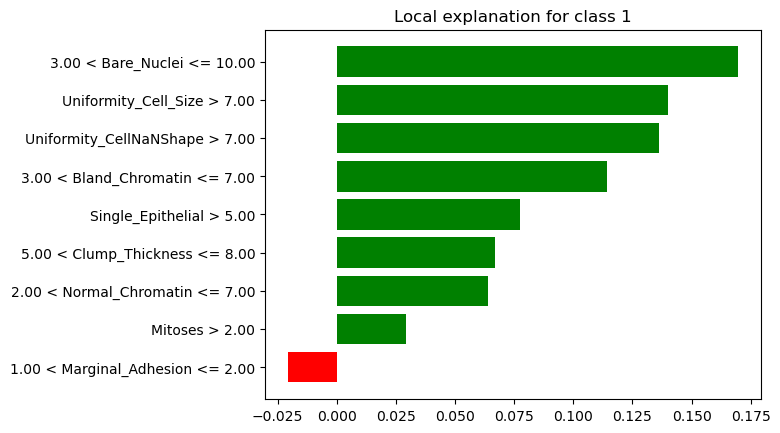

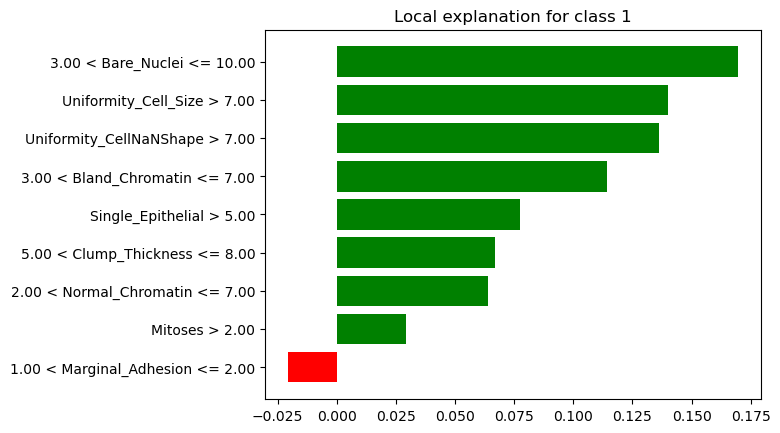

In [40]:
exp.as_pyplot_figure()

In [116]:
!pip install shap

In [117]:
!pip install javascript

  Obtaining dependency information for javascript from https://files.pythonhosted.org/packages/ff/dc/7ddf13a62635c0f18dd9f34193bb0755d384e0df823d4b2e2f5e7a9210fc/javascript-1%211.1.3-py3-none-any.whl.metadata


In [65]:
!pip install shap
!pip install lime
!pip install eli5


In [2]:
#Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import itertools

#scikit-learn package (https://pypi.org/project/scikit-learn)
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc, roc_auc_score
from sklearn.metrics import get_scorer_names

#eli5 package (https://eli5.readthedocs.io/en/latest)
import eli5
from eli5.sklearn import PermutationImportance

#lime package (https://github.com/marcotcr/lime)
import lime
import lime.lime_tabular

#shap package (https://github.com/slundberg/shap)
import shap

ImportError: cannot import name 'if_delegate_has_method' from 'sklearn.utils.metaestimators' (c:\Users\PC-USER\anaconda3\Lib\site-packages\sklearn\utils\metaestimators.py)

In [3]:
!pip install -U imbalanced-learn

In [ ]:
# Initialize SHAP Tree explainer
explainer = shap.TreeExplainer(, model_output='margin')
shap_values = explainer.shap_values(X_test)

# Baseline value
expected_value = explainer.expected_value
if isinstance(expected_value, list):
    expected_value = expected_value[1]
print(f"Explainer expected value: {expected_value}")